# Лабораторная работа 6. CNN-классификация изображений

В этой части лабораторной работы решается задача классификации изображений листьев маниоки из набора данных **Cassava Leaf Disease Classification**.

Цель работы:

1. Подготовить данные для обучения CNN.
2. Обучить собственную сверточную нейронную сеть.
3. Провести несколько экспериментов с разными оптимизаторами, scheduler и аугментациями.
4. Сравнить результаты в таблице.
5. Построить графики обучения.
6. Выполнить визуализацию внутренних признаков модели.
7. Сравнить собственную CNN с transfer learning моделью.


In [19]:
# import kagglehub

# path = kagglehub.dataset_download("nirmalsankalana/cassava-leaf-disease-classification")

# print("Path to dataset files:", path)

In [20]:
from pathlib import Path
import json
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, models

from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("PyTorch:", torch.__version__)
print("Device:", device)

PyTorch: 2.11.0+cu128
Device: cuda


In [21]:
from pathlib import Path

DATASET_ROOT = Path(r"C:\Users\motyn\.cache\kagglehub\datasets\nirmalsankalana\cassava-leaf-disease-classification\versions\2")
DATA_DIR = DATASET_ROOT / "data"

print(DATA_DIR)
print(list(DATA_DIR.iterdir())[:10])


C:\Users\motyn\.cache\kagglehub\datasets\nirmalsankalana\cassava-leaf-disease-classification\versions\2\data
[WindowsPath('C:/Users/motyn/.cache/kagglehub/datasets/nirmalsankalana/cassava-leaf-disease-classification/versions/2/data/Cassava___bacterial_blight'), WindowsPath('C:/Users/motyn/.cache/kagglehub/datasets/nirmalsankalana/cassava-leaf-disease-classification/versions/2/data/Cassava___brown_streak_disease'), WindowsPath('C:/Users/motyn/.cache/kagglehub/datasets/nirmalsankalana/cassava-leaf-disease-classification/versions/2/data/Cassava___green_mottle'), WindowsPath('C:/Users/motyn/.cache/kagglehub/datasets/nirmalsankalana/cassava-leaf-disease-classification/versions/2/data/Cassava___healthy'), WindowsPath('C:/Users/motyn/.cache/kagglehub/datasets/nirmalsankalana/cassava-leaf-disease-classification/versions/2/data/Cassava___mosaic_disease')]


In [22]:
for item in DATA_DIR.iterdir():
    if item.is_dir():
        image_count = len(list(item.glob("*")))
        print(item.name, "-", image_count)
    else:
        print(item.name)

Cassava___bacterial_blight - 1087
Cassava___brown_streak_disease - 2189
Cassava___green_mottle - 2386
Cassava___healthy - 2577
Cassava___mosaic_disease - 13158


Всего изображений: 21397
Пример пути: C:\Users\motyn\.cache\kagglehub\datasets\nirmalsankalana\cassava-leaf-disease-classification\versions\2\data\Cassava___bacterial_blight\1000015157.jpg


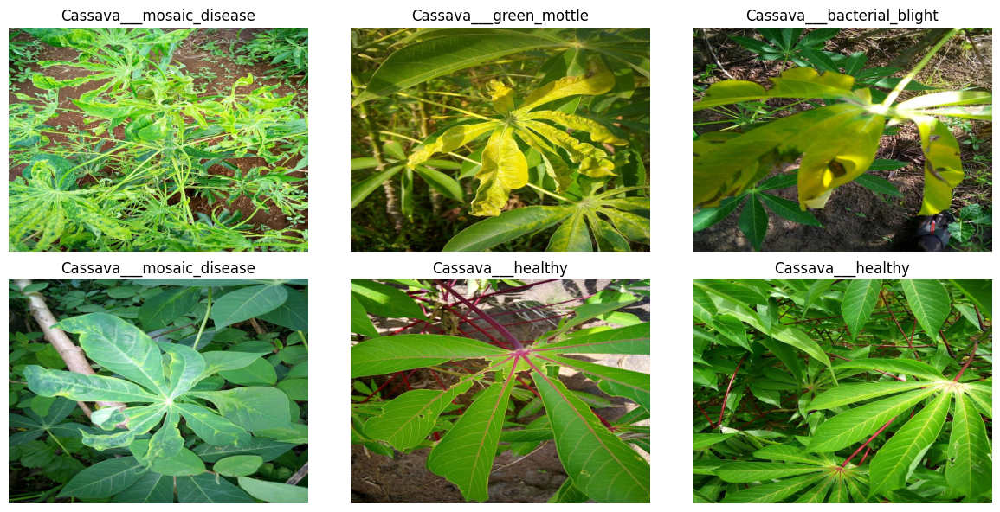

In [23]:
image_paths = list(DATA_DIR.rglob("*.jpg")) + list(DATA_DIR.rglob("*.png")) + list(DATA_DIR.rglob("*.jpeg"))

print("Всего изображений:", len(image_paths))
print("Пример пути:", image_paths[0])

sample_paths = random.sample(image_paths, 6)

plt.figure(figsize=(12, 6))

for i, img_path in enumerate(sample_paths, 1):
    image = Image.open(img_path).convert("RGB")
    label = img_path.parent.name

    plt.subplot(2, 3, i)
    plt.imshow(image)
    plt.title(label)
    plt.axis("off")

plt.tight_layout()
plt.show()

## Подготовка данных

Датасет содержит изображения листьев маниоки, разложенные по папкам классов.  
Каждая папка соответствует одному заболеванию или здоровому состоянию растения.

Классы:

- `Cassava___bacterial_blight`
- `Cassava___brown_streak_disease`
- `Cassava___green_mottle`
- `Cassava___healthy`
- `Cassava___mosaic_disease`

Для обучения данные будут разделены на обучающую и тестовую выборки с сохранением пропорций классов.

Классы:
0 - Cassava___bacterial_blight
1 - Cassava___brown_streak_disease
2 - Cassava___green_mottle
3 - Cassava___healthy
4 - Cassava___mosaic_disease


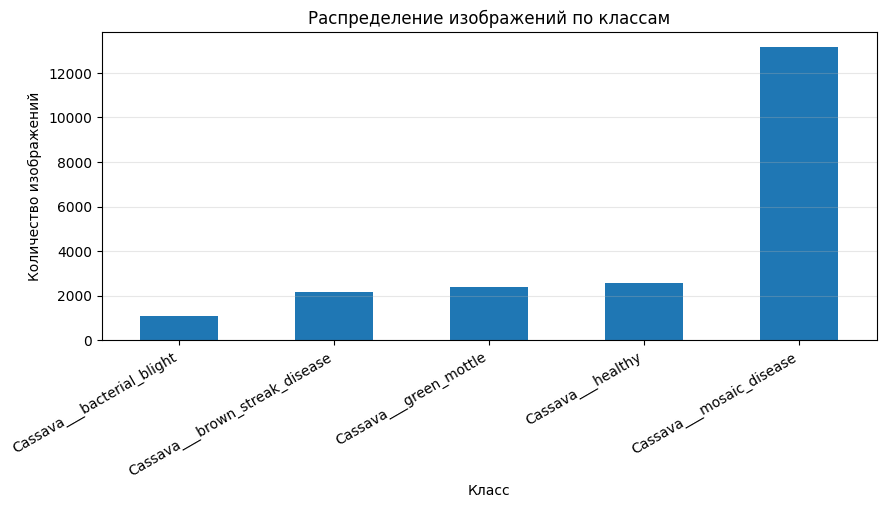

,count
Cassava___bacterial_blight,1087
Cassava___brown_streak_disease,2189
Cassava___green_mottle,2386
Cassava___healthy,2577
Cassava___mosaic_disease,13158


In [24]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split

base_dataset = ImageFolder(DATA_DIR)

class_names = base_dataset.classes
targets = np.array([label for _, label in base_dataset.samples])

print("Классы:")
for i, class_name in enumerate(class_names):
    print(i, "-", class_name)

class_counts = pd.Series(targets).value_counts().sort_index()
class_counts.index = class_names

plt.figure(figsize=(10, 4))
class_counts.plot(kind="bar")
plt.title("Распределение изображений по классам")
plt.xlabel("Класс")
plt.ylabel("Количество изображений")
plt.xticks(rotation=30, ha="right")
plt.grid(axis="y", alpha=0.3)
plt.show()

display(class_counts.to_frame(name="count"))

In [25]:
indices = np.arange(len(base_dataset))

train_indices, test_indices = train_test_split(
    indices,
    test_size=0.2,
    random_state=SEED,
    stratify=targets
)

print("Train size:", len(train_indices))
print("Test size:", len(test_indices))

IMAGE_SIZE = 128
BATCH_SIZE = 32

train_transform_basic = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

train_transform_aug = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

train_dataset_basic_full = ImageFolder(DATA_DIR, transform=train_transform_basic)
train_dataset_aug_full = ImageFolder(DATA_DIR, transform=train_transform_aug)
test_dataset_full = ImageFolder(DATA_DIR, transform=test_transform)

train_dataset_basic = Subset(train_dataset_basic_full, train_indices)
train_dataset_aug = Subset(train_dataset_aug_full, train_indices)
test_dataset = Subset(test_dataset_full, test_indices)

NUM_WORKERS = 4

train_loader_basic = DataLoader(
    train_dataset_basic,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

train_loader_aug = DataLoader(
    train_dataset_aug,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

print("Train batches:", len(train_loader_basic))
print("Test batches:", len(test_loader))

Train size: 17117
Test size: 4280
Train batches: 535
Test batches: 134


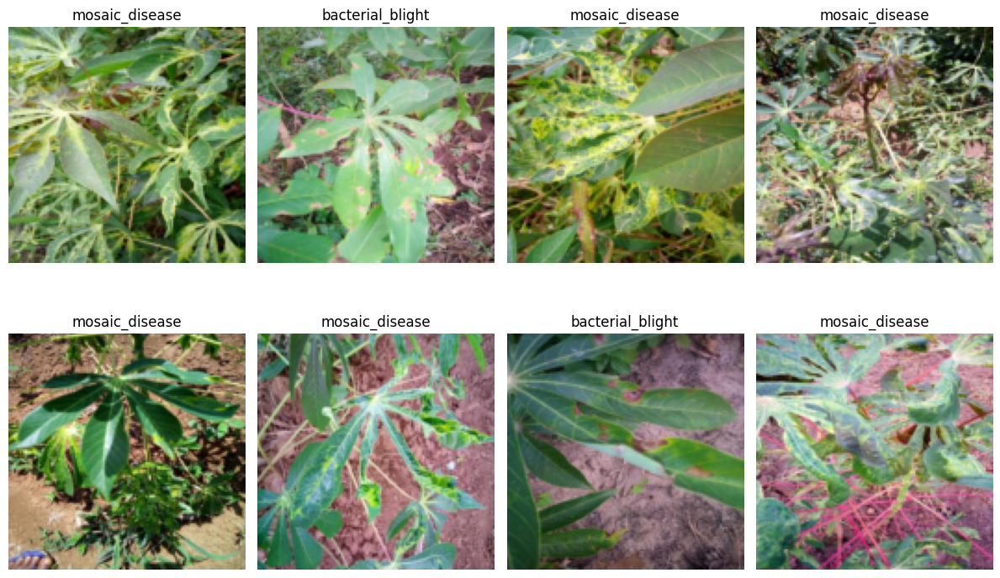

In [26]:
def denormalize_image(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    image = tensor.cpu() * std + mean
    return image.clamp(0, 1)


images, labels = next(iter(train_loader_basic))

plt.figure(figsize=(12, 8))

for i in range(8):
    image = denormalize_image(images[i]).permute(1, 2, 0)
    label = class_names[labels[i]]

    plt.subplot(2, 4, i + 1)
    plt.imshow(image)
    plt.title(label.replace("Cassava___", ""))
    plt.axis("off")

plt.tight_layout()
plt.show()

## Собственная CNN-модель

Для первого эксперимента используется собственная сверточная нейронная сеть, похожая на модель из предыдущей лабораторной работы.

Архитектура состоит из трех сверточных блоков:

- `Conv2d`
- `ReLU`
- `MaxPool2d`

После сверточной части признаки преобразуются в одномерный вектор с помощью `Flatten`, затем проходят через полносвязный классификатор.

Для уменьшения переобучения перед последним слоем используется `Dropout`.

Количество выходных нейронов последнего слоя равно количеству классов датасета.

In [27]:
class CassavaCNN(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        self.net = nn.Sequential(
            # Блок 1: 128x128 -> 64x64
            nn.Conv2d(3, 32, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            # Блок 2: 64x64 -> 32x32
            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            # Блок 3: 32x32 -> 16x16
            nn.Conv2d(64, 128, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            # Классификатор
            nn.Flatten(),
            nn.Linear(128 * 16 * 16, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.net(x)


num_classes = len(class_names)

model = CassavaCNN(num_classes).to(device)

print(model)
print(f"\nПараметров: {sum(p.numel() for p in model.parameters()):,}")

images, labels = next(iter(train_loader_basic))
test_output = model(images.to(device))

print("Input shape:", images.shape)
print("Output shape:", test_output.shape)


CassavaCNN(
  (net): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (9): Flatten(start_dim=1, end_dim=-1)
    (10): Linear(in_features=32768, out_features=256, bias=True)
    (11): ReLU()
    (12): Dropout(p=0.3, inplace=False)
    (13): Linear(in_features=256, out_features=5, bias=True)
  )
)

Параметров: 8,483,397
Input shape: torch.Size([32, 3, 128, 128])
Output shape: torch.Size([32, 5])


In [28]:
def train_one_epoch(model, loader, criterion, optimizer):
    model.train()

    running_loss = 0
    correct = 0
    total = 0

    for images, labels in tqdm(loader):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        predictions = outputs.argmax(dim=1)
        correct += (predictions == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_accuracy = correct / total

    return epoch_loss, epoch_accuracy

In [29]:
def evaluate(model, loader, criterion):
    model.eval()

    running_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(loader):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            predictions = outputs.argmax(dim=1)
            correct += (predictions == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_accuracy = correct / total

    return epoch_loss, epoch_accuracy

In [30]:
def run_experiment(model, train_loader, test_loader, criterion, optimizer, epochs, scheduler=None):
    history = {
        "train_loss": [],
        "train_accuracy": [],
        "test_loss": [],
        "test_accuracy": []
    }

    for epoch in range(epochs):
        print(f"Epoch {epoch + 1}/{epochs}")

        train_loss, train_accuracy = train_one_epoch(
            model,
            train_loader,
            criterion,
            optimizer
        )

        test_loss, test_accuracy = evaluate(
            model,
            test_loader,
            criterion
        )

        if scheduler is not None:
            scheduler.step()

        history["train_loss"].append(train_loss)
        history["train_accuracy"].append(train_accuracy)
        history["test_loss"].append(test_loss)
        history["test_accuracy"].append(test_accuracy)

        print(
            f"train_loss: {train_loss:.4f}, "
            f"train_acc: {train_accuracy:.4f}, "
            f"test_loss: {test_loss:.4f}, "
            f"test_acc: {test_accuracy:.4f}"
        )
        print()

    return history


EPOCHS = 3

model_adam = CassavaCNN(num_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer_adam = optim.Adam(model_adam.parameters(), lr=0.001)

history_adam = run_experiment(
    model=model_adam,
    train_loader=train_loader_basic,
    test_loader=test_loader,
    criterion=criterion,
    optimizer=optimizer_adam,
    epochs=EPOCHS
)

Epoch 1/3


100%|██████████| 134/134 [00:31<00:00,  4.25it/s]


train_loss: 1.0288, train_acc: 0.6358, test_loss: 0.9337, test_acc: 0.6472

Epoch 2/3


100%|██████████| 134/134 [00:27<00:00,  4.96it/s]


train_loss: 0.8988, train_acc: 0.6651, test_loss: 0.8801, test_acc: 0.6701

Epoch 3/3


100%|██████████| 134/134 [00:26<00:00,  5.13it/s]


train_loss: 0.8135, train_acc: 0.6887, test_loss: 0.8494, test_acc: 0.6855



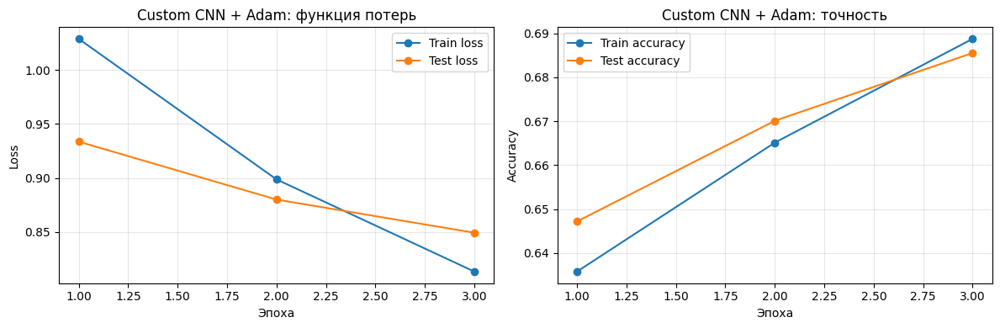

In [31]:
def plot_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_loss"], marker="o", label="Train loss")
    plt.plot(epochs, history["test_loss"], marker="o", label="Test loss")
    plt.title(f"{title}: функция потерь")
    plt.xlabel("Эпоха")
    plt.ylabel("Loss")
    plt.grid(alpha=0.3)
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_accuracy"], marker="o", label="Train accuracy")
    plt.plot(epochs, history["test_accuracy"], marker="o", label="Test accuracy")
    plt.title(f"{title}: точность")
    plt.xlabel("Эпоха")
    plt.ylabel("Accuracy")
    plt.grid(alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()


plot_history(history_adam, "Custom CNN + Adam")

In [32]:
experiment_results = []

experiment_results.append({
    "Эксперимент": "Custom CNN + Adam",
    "Train accuracy": history_adam["train_accuracy"][-1],
    "Test accuracy": history_adam["test_accuracy"][-1],
    "Train loss": history_adam["train_loss"][-1],
    "Test loss": history_adam["test_loss"][-1]
})

results_df = pd.DataFrame(experiment_results)

display(results_df)

,Эксперимент,Train accuracy,Test accuracy,Train loss,Test loss
0,Custom CNN + Adam,0.688731,0.685514,0.813521,0.849433


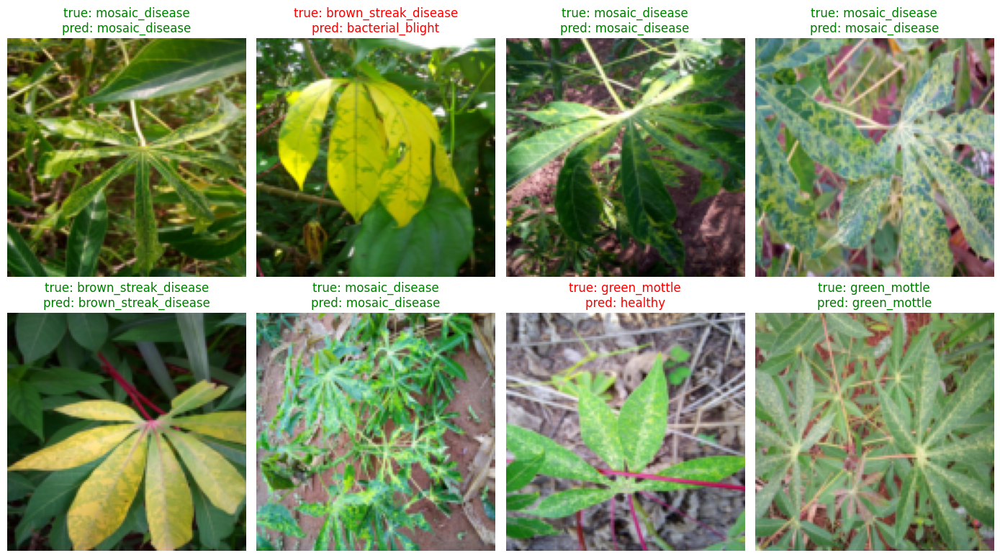

In [33]:
model_adam.eval()

images, labels = next(iter(test_loader))

with torch.no_grad():
    outputs = model_adam(images.to(device))
    predictions = outputs.argmax(dim=1).cpu()

plt.figure(figsize=(14, 8))

for i in range(8):
    image = denormalize_image(images[i]).permute(1, 2, 0)

    true_label = class_names[labels[i]].replace("Cassava___", "")
    pred_label = class_names[predictions[i]].replace("Cassava___", "")

    color = "green" if labels[i] == predictions[i] else "red"

    plt.subplot(2, 4, i + 1)
    plt.imshow(image)
    plt.title(f"true: {true_label}\npred: {pred_label}", color=color)
    plt.axis("off")

plt.tight_layout()
plt.show()

## Эксперимент 2: Custom CNN + SGD Momentum

Во втором эксперименте используется та же собственная CNN-модель, но меняется оптимизатор.

Вместо `Adam` используется `SGD` с параметром `momentum=0.9`.  
Это позволяет сравнить влияние оптимизатора на скорость и качество обучения.

In [34]:
model_sgd = CassavaCNN(num_classes).to(device)

criterion = nn.CrossEntropyLoss()

optimizer_sgd = optim.SGD(
    model_sgd.parameters(),
    lr=0.01,
    momentum=0.9
)

history_sgd = run_experiment(
    model=model_sgd,
    train_loader=train_loader_basic,
    test_loader=test_loader,
    criterion=criterion,
    optimizer=optimizer_sgd,
    epochs=EPOCHS
)

experiment_results.append({
    "Эксперимент": "Custom CNN + SGD Momentum",
    "Train accuracy": history_sgd["train_accuracy"][-1],
    "Test accuracy": history_sgd["test_accuracy"][-1],
    "Train loss": history_sgd["train_loss"][-1],
    "Test loss": history_sgd["test_loss"][-1]
})

results_df = pd.DataFrame(experiment_results)
display(results_df)

Epoch 1/3


100%|██████████| 134/134 [00:26<00:00,  4.98it/s]


train_loss: 1.0893, train_acc: 0.6201, test_loss: 1.0331, test_acc: 0.6283

Epoch 2/3


100%|██████████| 134/134 [00:26<00:00,  5.01it/s]


train_loss: 0.9742, train_acc: 0.6443, test_loss: 0.9993, test_acc: 0.6428

Epoch 3/3


100%|██████████| 134/134 [00:27<00:00,  4.94it/s]


train_loss: 0.8887, train_acc: 0.6665, test_loss: 0.9258, test_acc: 0.6484



,Эксперимент,Train accuracy,Test accuracy,Train loss,Test loss
0,Custom CNN + Adam,0.688731,0.685514,0.813521,0.849433
1,Custom CNN + SGD Momentum,0.666472,0.648364,0.888749,0.925792


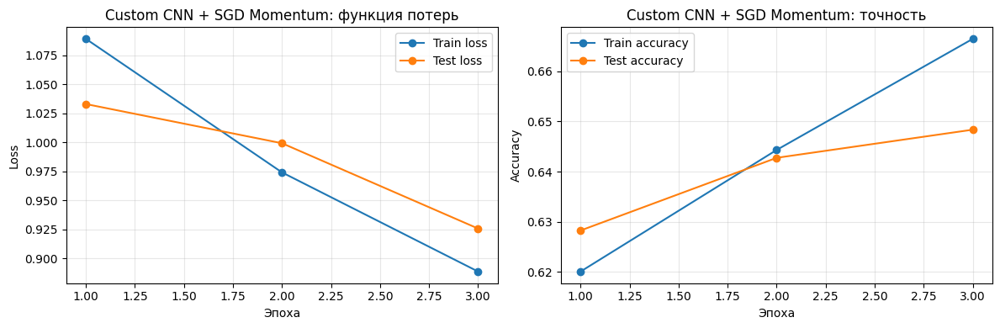

In [35]:
plot_history(history_sgd, "Custom CNN + SGD Momentum")

## Эксперимент 3: Custom CNN + Adam + Learning Rate Scheduler

В третьем эксперименте используется оптимизатор `Adam` вместе с планировщиком learning rate.

Планировщик `StepLR` уменьшает learning rate после заданного количества эпох.  
Это позволяет сделать обновления весов более аккуратными на поздних этапах обучения.

В эксперименте планировщик будет уменьщать lr в два раза каждую эпоху.

In [38]:
model_adam_scheduler = CassavaCNN(num_classes).to(device)

criterion = nn.CrossEntropyLoss()

optimizer_adam_scheduler = optim.Adam(
    model_adam_scheduler.parameters(),
    lr=0.001
)

scheduler_adam = optim.lr_scheduler.StepLR(
    optimizer_adam_scheduler,
    step_size=1,
    gamma=0.5
)

history_adam_scheduler = run_experiment(
    model=model_adam_scheduler,
    train_loader=train_loader_basic,
    test_loader=test_loader,
    criterion=criterion,
    optimizer=optimizer_adam_scheduler,
    epochs=EPOCHS,
    scheduler=scheduler_adam
)

experiment_results.append({
    "Эксперимент": "Custom CNN + Adam + LR scheduler",
    "Train accuracy": history_adam_scheduler["train_accuracy"][-1],
    "Test accuracy": history_adam_scheduler["test_accuracy"][-1],
    "Train loss": history_adam_scheduler["train_loss"][-1],
    "Test loss": history_adam_scheduler["test_loss"][-1]
})

results_df = pd.DataFrame(experiment_results)
display(results_df)

Epoch 1/3










































































































































100%|██████████| 535/535 [00:45<00:00, 11.89it/s]



































100%|██████████| 134/134 [00:28<00:00,  4.75it/s]


train_loss: 1.0541, train_acc: 0.6347, test_loss: 0.9990, test_acc: 0.6425

Epoch 2/3









































































































































100%|██████████| 535/535 [00:42<00:00, 12.61it/s]



































100%|██████████| 134/134 [00:27<00:00,  4.82it/s]


train_loss: 0.8965, train_acc: 0.6678, test_loss: 0.9331, test_acc: 0.6467

Epoch 3/3









































































































































100%|██████████| 535/535 [00:41<00:00, 12.79it/s]



































100%|██████████| 134/134 [00:26<00:00,  5.07it/s]


train_loss: 0.8117, train_acc: 0.6915, test_loss: 0.8348, test_acc: 0.6876



,Эксперимент,Train accuracy,Test accuracy,Train loss,Test loss
0,Custom CNN + Adam,0.688731,0.685514,0.813521,0.849433
1,Custom CNN + SGD Momentum,0.666472,0.648364,0.888749,0.925792
2,Custom CNN + Adam + LR scheduler,0.691476,0.687617,0.811716,0.834831


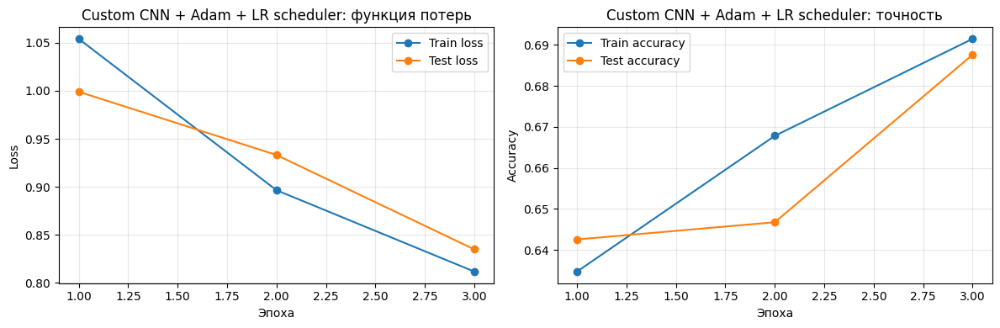

In [39]:
plot_history(history_adam_scheduler, "Custom CNN + Adam + LR scheduler")

## Эксперимент 4: Custom CNN + Adam + Image Augmentation

В четвертом эксперименте используется та же CNN-модель и оптимизатор `Adam`, но обучающая выборка проходит через аугментации изображений.

Использованные аугментации:

- случайное горизонтальное отражение;
- случайный поворот;
- изменение яркости, контраста и насыщенности.

Аугментация позволяет искусственно увеличить разнообразие обучающих данных и уменьшить переобучение модели.

In [40]:
model_adam_aug = CassavaCNN(num_classes).to(device)

criterion = nn.CrossEntropyLoss()

optimizer_adam_aug = optim.Adam(
    model_adam_aug.parameters(),
    lr=0.001
)

history_adam_aug = run_experiment(
    model=model_adam_aug,
    train_loader=train_loader_aug,
    test_loader=test_loader,
    criterion=criterion,
    optimizer=optimizer_adam_aug,
    epochs=EPOCHS
)

experiment_results.append({
    "Эксперимент": "Custom CNN + Adam + image augmentation",
    "Train accuracy": history_adam_aug["train_accuracy"][-1],
    "Test accuracy": history_adam_aug["test_accuracy"][-1],
    "Train loss": history_adam_aug["train_loss"][-1],
    "Test loss": history_adam_aug["test_loss"][-1]
})

results_df = pd.DataFrame(experiment_results)
display(results_df)

Epoch 1/3


100%|██████████| 134/134 [00:26<00:00,  5.15it/s]


train_loss: 1.0672, train_acc: 0.6281, test_loss: 1.0269, test_acc: 0.6404

Epoch 2/3


100%|██████████| 134/134 [00:27<00:00,  4.87it/s]


train_loss: 0.9335, train_acc: 0.6603, test_loss: 0.8985, test_acc: 0.6657

Epoch 3/3


100%|██████████| 134/134 [00:26<00:00,  5.09it/s]


train_loss: 0.8698, train_acc: 0.6741, test_loss: 0.8198, test_acc: 0.6907



,Эксперимент,Train accuracy,Test accuracy,Train loss,Test loss
0,Custom CNN + Adam,0.688731,0.685514,0.813521,0.849433
1,Custom CNN + SGD Momentum,0.666472,0.648364,0.888749,0.925792
2,Custom CNN + Adam + LR scheduler,0.691476,0.687617,0.811716,0.834831
3,Custom CNN + Adam + image augmentation,0.674125,0.690654,0.869818,0.819849


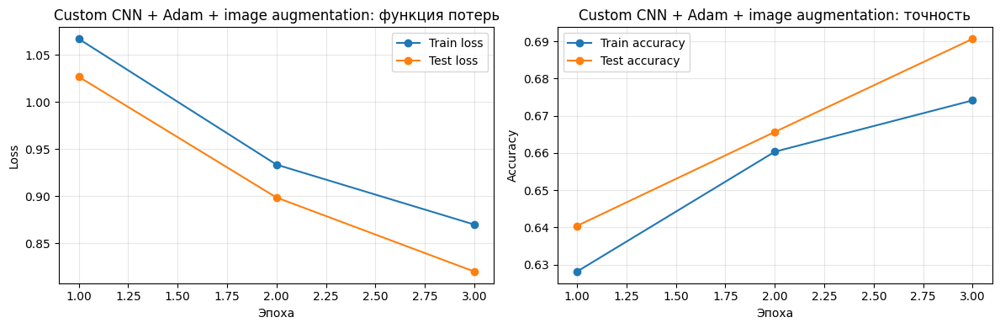

In [41]:
plot_history(history_adam_aug, "Custom CNN + Adam + image augmentation")

In [42]:
results_df = pd.DataFrame(experiment_results)

results_df_rounded = results_df.copy()

for column in ["Train accuracy", "Test accuracy", "Train loss", "Test loss"]:
    results_df_rounded[column] = results_df_rounded[column].round(4)

results_df_rounded = results_df_rounded.sort_values(
    by="Test accuracy",
    ascending=False
).reset_index(drop=True)

display(results_df_rounded)

,Эксперимент,Train accuracy,Test accuracy,Train loss,Test loss
0,Custom CNN + Adam + image augmentation,0.6741,0.6907,0.8698,0.8198
1,Custom CNN + Adam + LR scheduler,0.6915,0.6876,0.8117,0.8348
2,Custom CNN + Adam,0.6887,0.6855,0.8135,0.8494
3,Custom CNN + SGD Momentum,0.6665,0.6484,0.8887,0.9258


In [43]:
best_custom_model = model_adam_aug
best_custom_history = history_adam_aug
best_custom_name = "Custom CNN + Adam + image augmentation"

print("Лучшая собственная модель:", best_custom_name)
print("Test accuracy:", best_custom_history["test_accuracy"][-1])
print("Test loss:", best_custom_history["test_loss"][-1])

Лучшая собственная модель: Custom CNN + Adam + image augmentation
Test accuracy: 0.6906542056074766
Test loss: 0.8198485661889905


## Визуализация активаций внутренних слоев

Для анализа работы CNN можно посмотреть карты активаций после сверточных слоев.

Карты активаций показывают, какие области изображения активируют фильтры сети.  
На ранних слоях обычно выделяются простые признаки: края, цветовые переходы и текстуры.  
На более глубоких слоях признаки становятся более абстрактными.

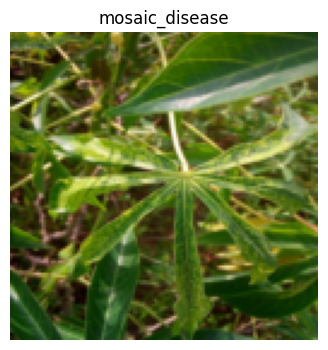

In [44]:
sample_image, sample_label = test_dataset[0]

plt.figure(figsize=(4, 4))
plt.imshow(denormalize_image(sample_image).permute(1, 2, 0))
plt.title(class_names[sample_label].replace("Cassava___", ""))
plt.axis("off")
plt.show()

sample_input = sample_image.unsqueeze(0).to(device)

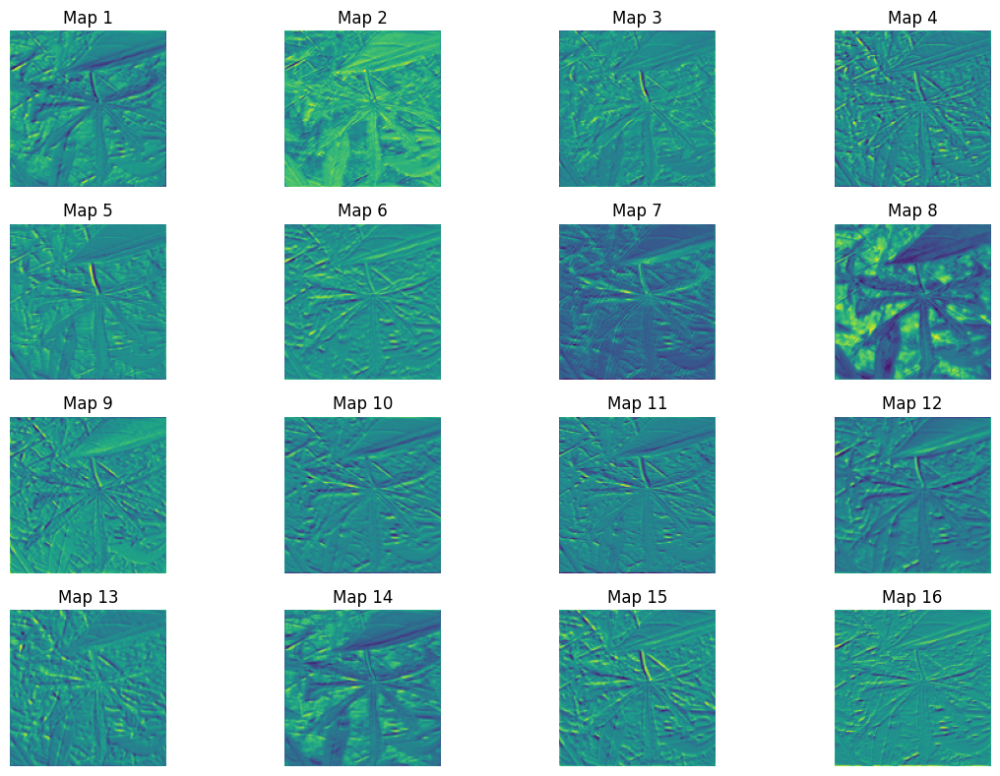

In [45]:
activation = {}

def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach().cpu()
    return hook


first_conv_layer = best_custom_model.net[0]
hook = first_conv_layer.register_forward_hook(get_activation("first_conv"))

best_custom_model.eval()

with torch.no_grad():
    _ = best_custom_model(sample_input)

hook.remove()

feature_maps = activation["first_conv"][0]

plt.figure(figsize=(12, 8))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(feature_maps[i], cmap="viridis")
    plt.title(f"Map {i + 1}")
    plt.axis("off")

plt.tight_layout()
plt.show()

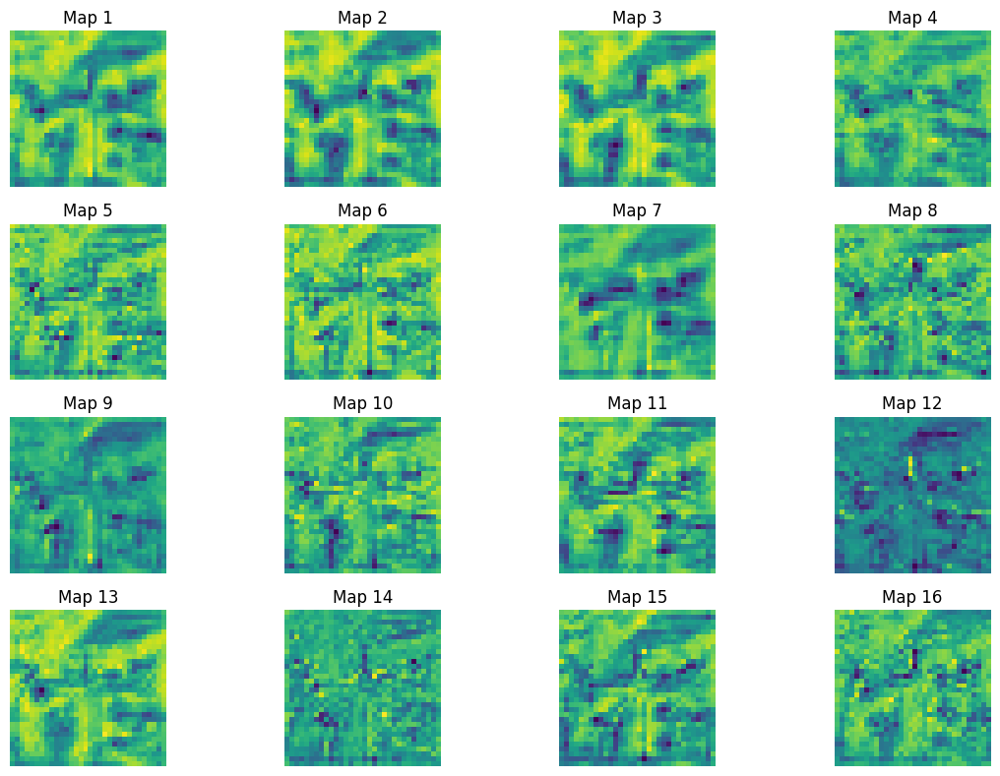

In [46]:
activation = {}

third_conv_layer = best_custom_model.net[6]
hook = third_conv_layer.register_forward_hook(get_activation("third_conv"))

best_custom_model.eval()

with torch.no_grad():
    _ = best_custom_model(sample_input)

hook.remove()

feature_maps = activation["third_conv"][0]

plt.figure(figsize=(12, 8))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(feature_maps[i], cmap="viridis")
    plt.title(f"Map {i + 1}")
    plt.axis("off")

plt.tight_layout()
plt.show()

### Вывод по визуализации активаций

На картах активаций первого сверточного слоя заметны простые признаки изображения: контуры листьев, прожилки, границы объектов и локальные изменения яркости.

На более глубоких слоях карты активаций становятся менее похожими на исходное изображение. Это связано с тем, что глубокие слои CNN выделяют более абстрактные признаки, которые важны для классификации заболевания листа.

Таким образом, визуализация подтверждает, что сверточная сеть постепенно переходит от низкоуровневых признаков к более сложным внутренним представлениям.

## Transfer Learning

Следующий этап лабораторной работы — использование предобученной модели.

В качестве модели transfer learning используется `ResNet18`, предварительно обученная на ImageNet.  
Последний классификационный слой заменяется на новый слой с количеством выходов, равным числу классов в датасете Cassava.

In [48]:
resnet_model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

for param in resnet_model.parameters():
    param.requires_grad = False

in_features = resnet_model.fc.in_features
resnet_model.fc = nn.Linear(in_features, num_classes)

resnet_model = resnet_model.to(device)

print(resnet_model)
print(f"\nОбучаемых параметров: {sum(p.numel() for p in resnet_model.parameters() if p.requires_grad):,}")
print(f"Всего параметров: {sum(p.numel() for p in resnet_model.parameters()):,}")

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to C:\Users\motyn/.cache\torch\hub\checkpoints\resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:04<00:00, 10.3MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

В данном эксперименте обучается только последний классификационный слой ResNet18.  
Сверточная часть модели используется как готовый экстрактор признаков, обученный на ImageNet.

Такой подход позволяет получить хорошее качество даже при небольшом количестве эпох, так как модель уже умеет извлекать общие визуальные признаки.

In [49]:
resnet_train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

resnet_test_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

resnet_train_full = ImageFolder(DATA_DIR, transform=resnet_train_transform)
resnet_test_full = ImageFolder(DATA_DIR, transform=resnet_test_transform)

resnet_train_dataset = Subset(resnet_train_full, train_indices)
resnet_test_dataset = Subset(resnet_test_full, test_indices)

resnet_train_loader = DataLoader(
    resnet_train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

resnet_test_loader = DataLoader(
    resnet_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

print("ResNet train batches:", len(resnet_train_loader))
print("ResNet test batches:", len(resnet_test_loader))

ResNet train batches: 535
ResNet test batches: 134


In [50]:
EPOCHS_RESNET = 3

criterion = nn.CrossEntropyLoss()

optimizer_resnet = optim.Adam(
    resnet_model.fc.parameters(),
    lr=0.001
)

history_resnet = run_experiment(
    model=resnet_model,
    train_loader=resnet_train_loader,
    test_loader=resnet_test_loader,
    criterion=criterion,
    optimizer=optimizer_resnet,
    epochs=EPOCHS_RESNET
)

Epoch 1/3


100%|██████████| 134/134 [00:30<00:00,  4.37it/s]


train_loss: 0.9601, train_acc: 0.6553, test_loss: 0.8393, test_acc: 0.7019

Epoch 2/3


100%|██████████| 134/134 [00:30<00:00,  4.45it/s]


train_loss: 0.8517, train_acc: 0.6883, test_loss: 0.7907, test_acc: 0.7159

Epoch 3/3


100%|██████████| 134/134 [00:28<00:00,  4.74it/s]


train_loss: 0.8362, train_acc: 0.6905, test_loss: 0.7830, test_acc: 0.7164



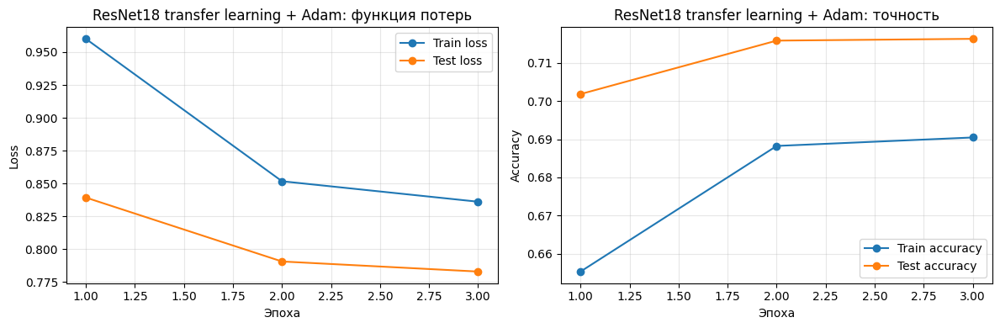

,Эксперимент,Train accuracy,Test accuracy,Train loss,Test loss
0,ResNet18 transfer learning + Adam,0.6905,0.7164,0.8362,0.7830
1,Custom CNN + Adam + image augmentation,0.6741,0.6907,0.8698,0.8198
2,Custom CNN + Adam + LR scheduler,0.6915,0.6876,0.8117,0.8348
3,Custom CNN + Adam,0.6887,0.6855,0.8135,0.8494
4,Custom CNN + SGD Momentum,0.6665,0.6484,0.8887,0.9258


In [51]:
plot_history(history_resnet, "ResNet18 transfer learning + Adam")

experiment_results.append({
    "Эксперимент": "ResNet18 transfer learning + Adam",
    "Train accuracy": history_resnet["train_accuracy"][-1],
    "Test accuracy": history_resnet["test_accuracy"][-1],
    "Train loss": history_resnet["train_loss"][-1],
    "Test loss": history_resnet["test_loss"][-1]
})

results_df = pd.DataFrame(experiment_results)

results_df_rounded = results_df.copy()

for column in ["Train accuracy", "Test accuracy", "Train loss", "Test loss"]:
    results_df_rounded[column] = results_df_rounded[column].round(4)

results_df_rounded = results_df_rounded.sort_values(
    by="Test accuracy",
    ascending=False
).reset_index(drop=True)

display(results_df_rounded)


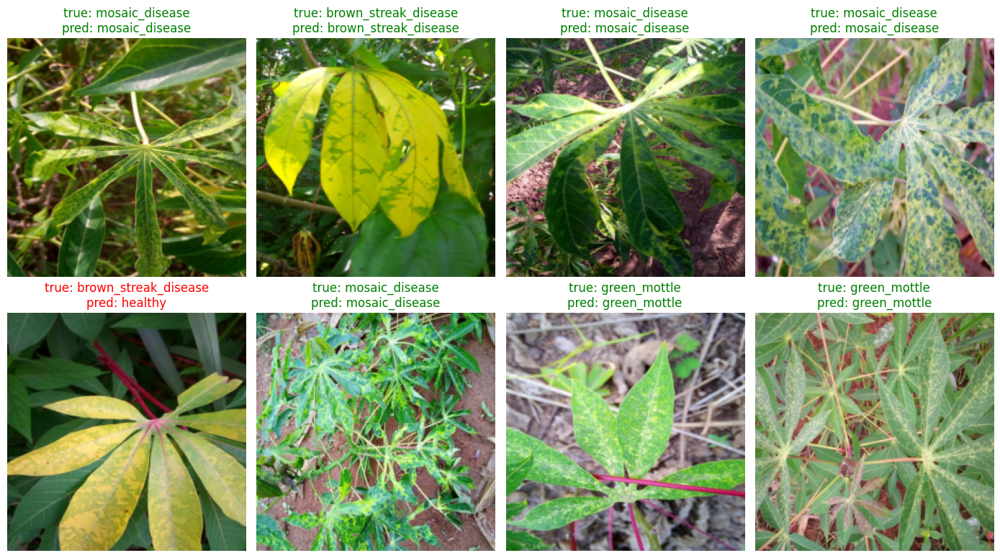

In [53]:
resnet_model.eval()

images, labels = next(iter(resnet_test_loader))

with torch.no_grad():
    outputs = resnet_model(images.to(device))
    predictions = outputs.argmax(dim=1).cpu()

plt.figure(figsize=(14, 8))

for i in range(8):
    image = denormalize_image(images[i]).permute(1, 2, 0)

    true_label = class_names[labels[i]].replace("Cassava___", "")
    pred_label = class_names[predictions[i]].replace("Cassava___", "")

    color = "green" if labels[i] == predictions[i] else "red"

    plt.subplot(2, 4, i + 1)
    plt.imshow(image)
    plt.title(f"true: {true_label}\npred: {pred_label}", color=color)
    plt.axis("off")

plt.tight_layout()
plt.show()

### Вывод по transfer learning

Модель `ResNet18`, предобученная на ImageNet, показала лучший результат среди проведенных экспериментов.

В отличие от собственной CNN, ResNet18 уже содержит обученные сверточные фильтры, которые умеют выделять общие визуальные признаки: контуры, текстуры, формы и цветовые переходы.  
В лабораторной работе обучался только последний классификационный слой, поэтому модель смогла получить хорошее качество даже за небольшое количество эпох.

По итогам экспериментов transfer learning оказался эффективнее обучения собственной CNN с нуля.

100%|██████████| 134/134 [00:31<00:00,  4.29it/s]


<Figure size 800x800 with 0 Axes>

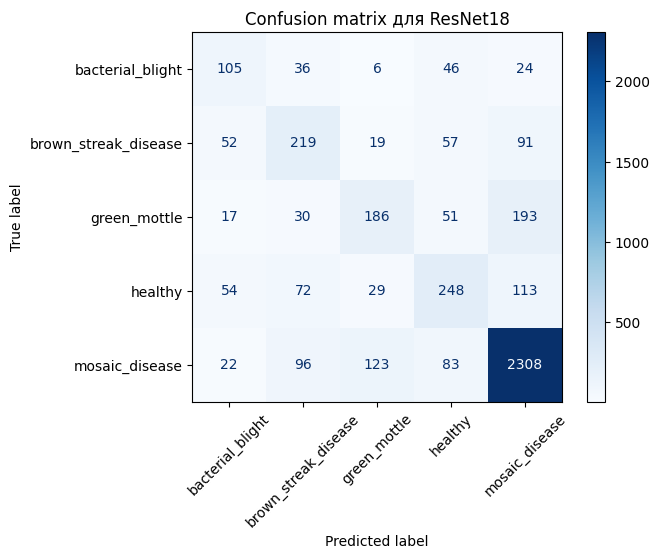

In [54]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

resnet_model.eval()

all_labels = []
all_predictions = []

with torch.no_grad():
    for images, labels in tqdm(resnet_test_loader):
        images = images.to(device)

        outputs = resnet_model(images)
        predictions = outputs.argmax(dim=1).cpu()

        all_labels.extend(labels.numpy())
        all_predictions.extend(predictions.numpy())

cm = confusion_matrix(all_labels, all_predictions)

plt.figure(figsize=(8, 8))
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=[name.replace("Cassava___", "") for name in class_names]
)
disp.plot(cmap="Blues", xticks_rotation=45)
plt.title("Confusion matrix для ResNet18")
plt.show()

### Анализ матрицы ошибок

По матрице ошибок видно, что модель лучше всего распознает класс `mosaic_disease`: для него получены самые высокие значения `precision`, `recall` и `f1-score`.

Это связано с дисбалансом датасета: изображений класса `mosaic_disease` значительно больше, чем изображений остальных классов. Поэтому модель чаще встречала этот класс во время обучения и научилась распознавать его лучше.

Редкие классы, например `bacterial_blight`, `brown_streak_disease`, `green_mottle` и `healthy`, распознаются хуже. Часть изображений этих классов модель ошибочно относит к `mosaic_disease`.

Общая точность модели составила около 72%, однако macro average для `f1-score` равен примерно 0.55. Это показывает, что качество классификации по отдельным классам отличается и модель хуже работает с менее представленными классами.

In [55]:
report = classification_report(
    all_labels,
    all_predictions,
    target_names=[name.replace("Cassava___", "") for name in class_names]
)

print(report)

                      precision    recall  f1-score   support

    bacterial_blight       0.42      0.48      0.45       217
brown_streak_disease       0.48      0.50      0.49       438
        green_mottle       0.51      0.39      0.44       477
             healthy       0.51      0.48      0.50       516
      mosaic_disease       0.85      0.88      0.86      2632

            accuracy                           0.72      4280
           macro avg       0.55      0.55      0.55      4280
        weighted avg       0.71      0.72      0.71      4280



In [56]:
results_df = pd.DataFrame(experiment_results)

results_df_rounded = results_df.copy()

for column in ["Train accuracy", "Test accuracy", "Train loss", "Test loss"]:
    results_df_rounded[column] = results_df_rounded[column].round(4)

results_df_rounded = results_df_rounded.sort_values(
    by="Test accuracy",
    ascending=False
).reset_index(drop=True)

display(results_df_rounded)

,Эксперимент,Train accuracy,Test accuracy,Train loss,Test loss
0,ResNet18 transfer learning + Adam,0.6905,0.7164,0.8362,0.7830
1,Custom CNN + Adam + image augmentation,0.6741,0.6907,0.8698,0.8198
2,Custom CNN + Adam + LR scheduler,0.6915,0.6876,0.8117,0.8348
3,Custom CNN + Adam,0.6887,0.6855,0.8135,0.8494
4,Custom CNN + SGD Momentum,0.6665,0.6484,0.8887,0.9258


### Сравнение экспериментов

По итоговой таблице видно, что лучший результат показала модель `ResNet18 transfer learning + Adam`: точность на тестовой выборке составила 0.7164.

Среди собственных CNN лучший результат дала модель с аугментацией изображений: test accuracy = 0.6907. Это показывает, что случайные преобразования изображений помогают модели лучше обобщать признаки и меньше переобучаться.

Использование learning rate scheduler также улучшило результат по сравнению с обычным `Adam`, но оказалось немного хуже варианта с аугментацией.

Худший результат среди проведенных экспериментов показал `SGD Momentum`. Вероятно, для этого оптимизатора требуется больше эпох или более точная настройка learning rate.

Таким образом, transfer learning оказался наиболее эффективным подходом для данной задачи, а среди моделей, обученных с нуля, лучше всего сработала CNN с аугментацией.

In [57]:
torch.save(resnet_model.state_dict(), "best_resnet18_cassava.pth")
print("Модель сохранена в best_resnet18_cassava.pth")

Модель сохранена в best_resnet18_cassava.pth


# Задание 1. Итоги

В первой части лабораторной работы была решена задача классификации изображений листьев маниоки.

Были обучены собственные CNN-модели с разными настройками и выполнено сравнение с transfer learning моделью ResNet18.

Лучший результат показала ResNet18 с точностью на тестовой выборке 0.7164.

In [ ]:
# import kagglehub

# path = kagglehub.dataset_download("bulentsiyah/semantic-drone-dataset")

# print("Path to dataset files:", path)

Resuming download from 3287285760 bytes (887246197 bytes left)...
Resuming download to C:\Users\motyn\.cache\kagglehub\datasets\bulentsiyah\semantic-drone-dataset\6.archive (3287285760/4174531957) bytes left.


100%|██████████| 3.89G/3.89G [01:18<00:00, 11.2MB/s]

Extracting files...


Path to dataset files: C:\Users\motyn\.cache\kagglehub\datasets\bulentsiyah\semantic-drone-dataset\versions\6


In [72]:
from pathlib import Path

SEG_DATASET_ROOT = Path(r"C:\Users\motyn\.cache\kagglehub\datasets\bulentsiyah\semantic-drone-dataset\versions\6")

print(SEG_DATASET_ROOT)
print(list(SEG_DATASET_ROOT.iterdir()))

C:\Users\motyn\.cache\kagglehub\datasets\bulentsiyah\semantic-drone-dataset\versions\6
[WindowsPath('C:/Users/motyn/.cache/kagglehub/datasets/bulentsiyah/semantic-drone-dataset/versions/6/class_dict_seg.csv'), WindowsPath('C:/Users/motyn/.cache/kagglehub/datasets/bulentsiyah/semantic-drone-dataset/versions/6/dataset'), WindowsPath('C:/Users/motyn/.cache/kagglehub/datasets/bulentsiyah/semantic-drone-dataset/versions/6/RGB_color_image_masks')]


# Задание 2. CNN-сегментация изображений

Во второй части лабораторной работы решается задача семантической сегментации аэроснимков на основе датасета **Semantic Drone Dataset**.

В отличие от классификации, в задаче сегментации модель должна определить класс не для всего изображения, а для каждого пикселя.

Требования задания:

- не обучать модель на полном разрешении;
- обучить несколько моделей сегментации;
- сравнить результаты;
- вывести примеры распознавания.

In [73]:
from pathlib import Path

SEG_DATASET_ROOT = Path(r"C:\Users\motyn\.cache\kagglehub\datasets\bulentsiyah\semantic-drone-dataset\versions\6")

class_dict_path = SEG_DATASET_ROOT / "class_dict_seg.csv"
images_root = SEG_DATASET_ROOT / "dataset"
rgb_masks_root = SEG_DATASET_ROOT / "RGB_color_image_masks"

print("Root:", SEG_DATASET_ROOT)
print("Class dict:", class_dict_path.exists())
print("Images root:", images_root.exists())
print("RGB masks root:", rgb_masks_root.exists())

print("\nDataset folder:")
print(list(images_root.iterdir())[:20])

print("\nRGB masks folder:")
print(list(rgb_masks_root.iterdir())[:20])

Root: C:\Users\motyn\.cache\kagglehub\datasets\bulentsiyah\semantic-drone-dataset\versions\6
Class dict: True
Images root: True
RGB masks root: True

Dataset folder:
[WindowsPath('C:/Users/motyn/.cache/kagglehub/datasets/bulentsiyah/semantic-drone-dataset/versions/6/dataset/semantic_drone_dataset')]

RGB masks folder:
[WindowsPath('C:/Users/motyn/.cache/kagglehub/datasets/bulentsiyah/semantic-drone-dataset/versions/6/RGB_color_image_masks/RGB_color_image_masks')]


In [74]:
seg_classes_df = pd.read_csv(class_dict_path)

display(seg_classes_df)

print("Количество классов:", len(seg_classes_df))

,name,r,g,b
0,unlabeled,0,0,0
1,paved-area,128,64,128
2,dirt,130,76,0
3,grass,0,102,0
4,gravel,112,103,87
5,water,28,42,168
6,rocks,48,41,30
7,pool,0,50,89
8,vegetation,107,142,35
9,roof,70,70,70


Количество классов: 24


In [79]:
seg_images_dir = SEG_DATASET_ROOT / "dataset" / "semantic_drone_dataset" / "original_images"
seg_label_masks_dir = SEG_DATASET_ROOT / "dataset" / "semantic_drone_dataset" / "label_images_semantic"
seg_rgb_masks_dir = SEG_DATASET_ROOT / "RGB_color_image_masks" / "RGB_color_image_masks"

print("Images:", seg_images_dir.exists(), seg_images_dir)
print("Label masks:", seg_label_masks_dir.exists(), seg_label_masks_dir)
print("RGB masks:", seg_rgb_masks_dir.exists(), seg_rgb_masks_dir)

Images: True C:\Users\motyn\.cache\kagglehub\datasets\bulentsiyah\semantic-drone-dataset\versions\6\dataset\semantic_drone_dataset\original_images
Label masks: True C:\Users\motyn\.cache\kagglehub\datasets\bulentsiyah\semantic-drone-dataset\versions\6\dataset\semantic_drone_dataset\label_images_semantic
RGB masks: True C:\Users\motyn\.cache\kagglehub\datasets\bulentsiyah\semantic-drone-dataset\versions\6\RGB_color_image_masks\RGB_color_image_masks


In [80]:
image_files = sorted(
    list(seg_images_dir.glob("*.jpg")) +
    list(seg_images_dir.glob("*.jpeg")) +
    list(seg_images_dir.glob("*.png"))
)

label_mask_files = sorted(list(seg_label_masks_dir.glob("*.png")))
rgb_mask_files = sorted(list(seg_rgb_masks_dir.glob("*.png")))

image_by_stem = {path.stem: path for path in image_files}
label_mask_by_stem = {path.stem: path for path in label_mask_files}
rgb_mask_by_stem = {path.stem: path for path in rgb_mask_files}

common_stems = sorted(
    set(image_by_stem.keys()) &
    set(label_mask_by_stem.keys()) &
    set(rgb_mask_by_stem.keys())
)

seg_pairs = [
    (image_by_stem[stem], label_mask_by_stem[stem], rgb_mask_by_stem[stem])
    for stem in common_stems
]

print("Изображений:", len(image_files))
print("Label-масок:", len(label_mask_files))
print("RGB-масок:", len(rgb_mask_files))
print("Готовых пар:", len(seg_pairs))

for image_path, label_mask_path, rgb_mask_path in seg_pairs[:5]:
    print(image_path.name, "|", label_mask_path.name, "|", rgb_mask_path.name)


Изображений: 400
Label-масок: 400
RGB-масок: 400
Готовых пар: 400
000.jpg | 000.png | 000.png
001.jpg | 001.png | 001.png
002.jpg | 002.png | 002.png
003.jpg | 003.png | 003.png
004.jpg | 004.png | 004.png


Image: 000.jpg (6000, 4000)
Label mask: 000.png (6000, 4000) uint8
RGB mask: 000.png (6000, 4000)


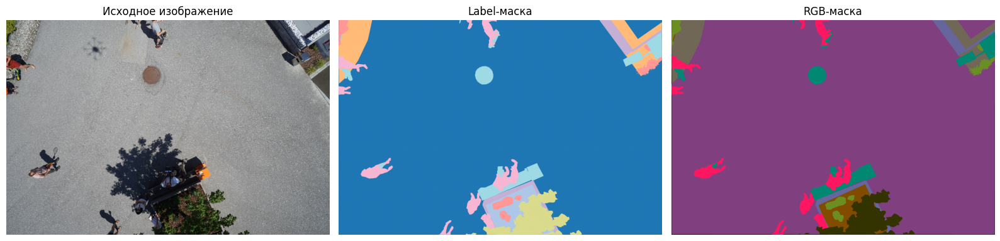

In [83]:
image_path, label_mask_path, rgb_mask_path = seg_pairs[0]

image = Image.open(image_path).convert("RGB")
label_mask = Image.open(label_mask_path)
rgb_mask = Image.open(rgb_mask_path).convert("RGB")

print("Image:", image_path.name, image.size)
print("Label mask:", label_mask_path.name, label_mask.size, np.array(label_mask).dtype)
print("RGB mask:", rgb_mask_path.name, rgb_mask.size)

plt.figure(figsize=(16, 5))

plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title("Исходное изображение")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(label_mask, cmap="tab20")
plt.title("Label-маска")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(rgb_mask)
plt.title("RGB-маска")
plt.axis("off")

plt.tight_layout()
plt.show()

## Подготовка данных для сегментации

Для обучения модели сегментации используются пары:

- исходное RGB-изображение;
- маска сегментации, где каждому пикселю соответствует номер класса.

Так как исходные изображения имеют большое разрешение, обучение выполняется не на полном размере, а на уменьшенных изображениях `256x256`.

In [82]:
class DroneSegmentationDataset(Dataset):
    def __init__(self, pairs, image_size=256):
        self.pairs = pairs
        self.image_size = image_size

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        image_path, label_mask_path, rgb_mask_path = self.pairs[idx]

        image = Image.open(image_path).convert("RGB")
        mask = Image.open(label_mask_path)

        image = image.resize((self.image_size, self.image_size), Image.BILINEAR)
        mask = mask.resize((self.image_size, self.image_size), Image.NEAREST)

        image = np.array(image).astype(np.float32) / 255.0
        mask = np.array(mask).astype(np.int64)

        image = torch.from_numpy(image).permute(2, 0, 1)
        mask = torch.from_numpy(mask)

        return image, mask

In [87]:
SEG_IMAGE_SIZE = 256
SEG_BATCH_SIZE = 4
SEG_NUM_WORKERS = 0

train_pairs, test_pairs = train_test_split(
    seg_pairs,
    test_size=0.2,
    random_state=SEED
)

seg_train_dataset = DroneSegmentationDataset(
    train_pairs,
    image_size=SEG_IMAGE_SIZE
)

seg_test_dataset = DroneSegmentationDataset(
    test_pairs,
    image_size=SEG_IMAGE_SIZE
)

seg_train_loader = DataLoader(
    seg_train_dataset,
    batch_size=SEG_BATCH_SIZE,
    shuffle=True,
    num_workers=SEG_NUM_WORKERS,
    pin_memory=True
)

seg_test_loader = DataLoader(
    seg_test_dataset,
    batch_size=SEG_BATCH_SIZE,
    shuffle=False,
    num_workers=SEG_NUM_WORKERS,
    pin_memory=True
)

print("Train images:", len(seg_train_dataset))
print("Test images:", len(seg_test_dataset))
print("Train batches:", len(seg_train_loader))
print("Test batches:", len(seg_test_loader))

Train images: 320
Test images: 80
Train batches: 80
Test batches: 20


In [88]:
images, masks = next(iter(seg_train_loader))

print("Images shape:", images.shape)
print("Masks shape:", masks.shape)
print("Image min/max:", images.min().item(), images.max().item())
print("Mask classes:", torch.unique(masks))

Images shape: torch.Size([4, 3, 256, 256])
Masks shape: torch.Size([4, 256, 256])
Image min/max: 0.003921568859368563 1.0
Mask classes: tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 13, 14, 15, 17, 18, 19,
        20, 21, 22])


In [90]:
print(seg_classes_df.columns)
display(seg_classes_df.head())

Index(['name', ' r', ' g', ' b'], dtype='str')


,name,r,g,b
0,unlabeled,0,0,0
1,paved-area,128,64,128
2,dirt,130,76,0
3,grass,0,102,0
4,gravel,112,103,87


In [91]:
seg_classes_df.columns = seg_classes_df.columns.str.strip()
class_colors = seg_classes_df[["r", "g", "b"]].values.astype(np.uint8)

def mask_to_rgb(mask):
    mask = np.array(mask)
    rgb_mask = class_colors[mask]
    return rgb_mask

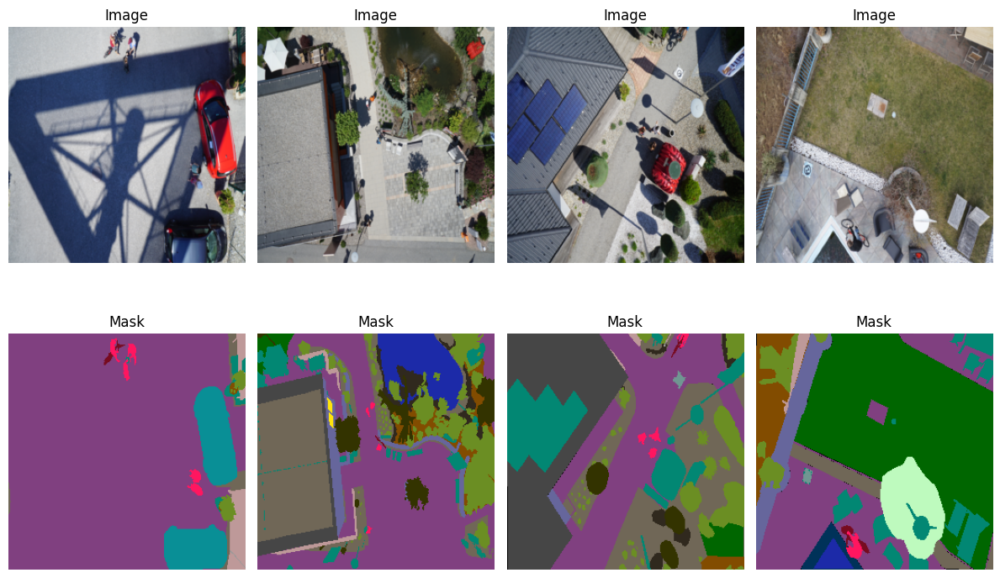

In [92]:
plt.figure(figsize=(12, 8))

for i in range(4):
    image = images[i].permute(1, 2, 0).numpy()
    mask_rgb = mask_to_rgb(masks[i].numpy())

    plt.subplot(2, 4, i + 1)
    plt.imshow(image)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(2, 4, i + 5)
    plt.imshow(mask_rgb)
    plt.title("Mask")
    plt.axis("off")

plt.tight_layout()
plt.show()

## Модель 1: Simple Encoder-Decoder CNN

Первая модель сегментации представляет собой простую сверточную encoder-decoder сеть.

Encoder постепенно уменьшает пространственное разрешение изображения и извлекает признаки.  
Decoder восстанавливает размер карты признаков обратно до размера исходной маски.

На выходе модель возвращает тензор размера:

`batch_size x num_classes x height x width`

Для каждого пикселя выбирается класс с максимальным значением.

In [93]:
class SimpleSegNet(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 256 -> 128

            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 128 -> 64

            nn.Conv2d(64, 128, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)   # 64 -> 32
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 2, stride=2),  # 32 -> 64
            nn.ReLU(),

            nn.ConvTranspose2d(64, 32, 2, stride=2),   # 64 -> 128
            nn.ReLU(),

            nn.ConvTranspose2d(32, num_classes, 2, stride=2)  # 128 -> 256
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


num_seg_classes = len(seg_classes_df)

simple_seg_model = SimpleSegNet(num_seg_classes).to(device)

test_output = simple_seg_model(images.to(device))

print(simple_seg_model)
print("Input shape:", images.shape)
print("Output shape:", test_output.shape)
print(f"Параметров: {sum(p.numel() for p in simple_seg_model.parameters()):,}")

SimpleSegNet(
  (encoder): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
    (1): ReLU()
    (2): ConvTranspose2d(64, 32, kernel_size=(2, 2), stride=(2, 2))
    (3): ReLU()
    (4): ConvTranspose2d(32, 24, kernel_size=(2, 2), stride=(2, 2))
  )
)
Input shape: torch.Size([4, 3, 256, 256])
Output shape: torch.Size([4, 24, 256, 256])
Параметров: 137,400


In [94]:
def segmentation_pixel_accuracy(outputs, masks):
    predictions = outputs.argmax(dim=1)
    correct = (predictions == masks).sum().item()
    total = masks.numel()
    return correct / total


def segmentation_mean_iou(outputs, masks, num_classes):
    predictions = outputs.argmax(dim=1)

    iou_values = []

    for class_id in range(num_classes):
        pred_class = predictions == class_id
        true_class = masks == class_id

        intersection = (pred_class & true_class).sum().item()
        union = (pred_class | true_class).sum().item()

        if union > 0:
            iou_values.append(intersection / union)

    return np.mean(iou_values)

In [95]:
def train_segmentation_one_epoch(model, loader, criterion, optimizer):
    model.train()

    running_loss = 0
    running_accuracy = 0
    running_iou = 0

    for images, masks in tqdm(loader):
        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, masks)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        running_accuracy += segmentation_pixel_accuracy(outputs, masks)
        running_iou += segmentation_mean_iou(outputs, masks, num_seg_classes)

    epoch_loss = running_loss / len(loader)
    epoch_accuracy = running_accuracy / len(loader)
    epoch_iou = running_iou / len(loader)

    return epoch_loss, epoch_accuracy, epoch_iou


def evaluate_segmentation(model, loader, criterion):
    model.eval()

    running_loss = 0
    running_accuracy = 0
    running_iou = 0

    with torch.no_grad():
        for images, masks in tqdm(loader):
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            running_loss += loss.item()
            running_accuracy += segmentation_pixel_accuracy(outputs, masks)
            running_iou += segmentation_mean_iou(outputs, masks, num_seg_classes)

    epoch_loss = running_loss / len(loader)
    epoch_accuracy = running_accuracy / len(loader)
    epoch_iou = running_iou / len(loader)

    return epoch_loss, epoch_accuracy, epoch_iou

In [96]:
def run_segmentation_experiment(model, train_loader, test_loader, criterion, optimizer, epochs):
    history = {
        "train_loss": [],
        "train_pixel_accuracy": [],
        "train_mean_iou": [],
        "test_loss": [],
        "test_pixel_accuracy": [],
        "test_mean_iou": []
    }

    for epoch in range(epochs):
        print(f"Epoch {epoch + 1}/{epochs}")

        train_loss, train_accuracy, train_iou = train_segmentation_one_epoch(
            model,
            train_loader,
            criterion,
            optimizer
        )

        test_loss, test_accuracy, test_iou = evaluate_segmentation(
            model,
            test_loader,
            criterion
        )

        history["train_loss"].append(train_loss)
        history["train_pixel_accuracy"].append(train_accuracy)
        history["train_mean_iou"].append(train_iou)
        history["test_loss"].append(test_loss)
        history["test_pixel_accuracy"].append(test_accuracy)
        history["test_mean_iou"].append(test_iou)

        print(
            f"train_loss: {train_loss:.4f}, "
            f"train_pix_acc: {train_accuracy:.4f}, "
            f"train_mIoU: {train_iou:.4f}, "
            f"test_loss: {test_loss:.4f}, "
            f"test_pix_acc: {test_accuracy:.4f}, "
            f"test_mIoU: {test_iou:.4f}"
        )
        print()

    return history

In [97]:
SEG_EPOCHS = 5

simple_seg_model = SimpleSegNet(num_seg_classes).to(device)

seg_criterion = nn.CrossEntropyLoss()
simple_seg_optimizer = optim.Adam(
    simple_seg_model.parameters(),
    lr=0.001
)

history_simple_seg = run_segmentation_experiment(
    model=simple_seg_model,
    train_loader=seg_train_loader,
    test_loader=seg_test_loader,
    criterion=seg_criterion,
    optimizer=simple_seg_optimizer,
    epochs=SEG_EPOCHS
)

Epoch 1/5


100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


train_loss: 2.3912, train_pix_acc: 0.3354, train_mIoU: 0.0197, test_loss: 2.0722, test_pix_acc: 0.3798, test_mIoU: 0.0211

Epoch 2/5


100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


train_loss: 2.1036, train_pix_acc: 0.3772, train_mIoU: 0.0200, test_loss: 2.0418, test_pix_acc: 0.3798, test_mIoU: 0.0211

Epoch 3/5


100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


train_loss: 2.1024, train_pix_acc: 0.3772, train_mIoU: 0.0200, test_loss: 2.0325, test_pix_acc: 0.3798, test_mIoU: 0.0211

Epoch 4/5


100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


train_loss: 2.0744, train_pix_acc: 0.3772, train_mIoU: 0.0202, test_loss: 1.9766, test_pix_acc: 0.3798, test_mIoU: 0.0211

Epoch 5/5


100%|██████████| 20/20 [00:17<00:00,  1.13it/s]

train_loss: 2.0473, train_pix_acc: 0.3772, train_mIoU: 0.0203, test_loss: 1.9380, test_pix_acc: 0.3798, test_mIoU: 0.0211



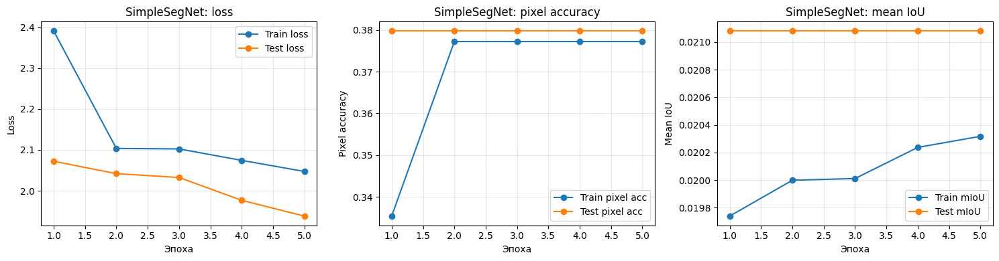

In [98]:
def plot_segmentation_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(15, 4))

    plt.subplot(1, 3, 1)
    plt.plot(epochs, history["train_loss"], marker="o", label="Train loss")
    plt.plot(epochs, history["test_loss"], marker="o", label="Test loss")
    plt.title(f"{title}: loss")
    plt.xlabel("Эпоха")
    plt.ylabel("Loss")
    plt.grid(alpha=0.3)
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(epochs, history["train_pixel_accuracy"], marker="o", label="Train pixel acc")
    plt.plot(epochs, history["test_pixel_accuracy"], marker="o", label="Test pixel acc")
    plt.title(f"{title}: pixel accuracy")
    plt.xlabel("Эпоха")
    plt.ylabel("Pixel accuracy")
    plt.grid(alpha=0.3)
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(epochs, history["train_mean_iou"], marker="o", label="Train mIoU")
    plt.plot(epochs, history["test_mean_iou"], marker="o", label="Test mIoU")
    plt.title(f"{title}: mean IoU")
    plt.xlabel("Эпоха")
    plt.ylabel("Mean IoU")
    plt.grid(alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()


plot_segmentation_history(history_simple_seg, "SimpleSegNet")

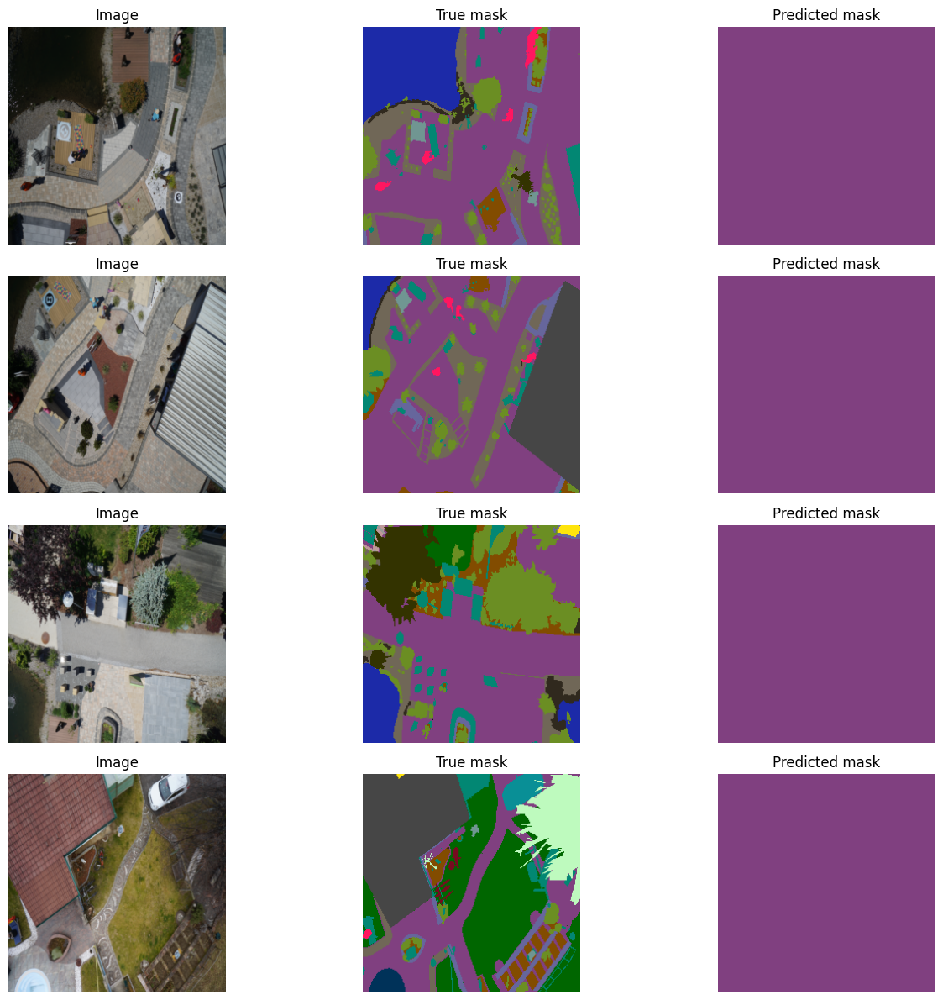

In [99]:
simple_seg_model.eval()

images, masks = next(iter(seg_test_loader))

with torch.no_grad():
    outputs = simple_seg_model(images.to(device))
    predictions = outputs.argmax(dim=1).cpu()

plt.figure(figsize=(14, 12))

for i in range(4):
    image = images[i].permute(1, 2, 0).numpy()
    true_mask_rgb = mask_to_rgb(masks[i].numpy())
    pred_mask_rgb = mask_to_rgb(predictions[i].numpy())

    plt.subplot(4, 3, i * 3 + 1)
    plt.imshow(image)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(4, 3, i * 3 + 2)
    plt.imshow(true_mask_rgb)
    plt.title("True mask")
    plt.axis("off")

    plt.subplot(4, 3, i * 3 + 3)
    plt.imshow(pred_mask_rgb)
    plt.title("Predicted mask")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [100]:
segmentation_results = []

segmentation_results.append({
    "Модель": "SimpleSegNet",
    "Train pixel accuracy": history_simple_seg["train_pixel_accuracy"][-1],
    "Test pixel accuracy": history_simple_seg["test_pixel_accuracy"][-1],
    "Train mean IoU": history_simple_seg["train_mean_iou"][-1],
    "Test mean IoU": history_simple_seg["test_mean_iou"][-1],
    "Train loss": history_simple_seg["train_loss"][-1],
    "Test loss": history_simple_seg["test_loss"][-1]
})

segmentation_results_df = pd.DataFrame(segmentation_results)

display(segmentation_results_df)

,Модель,Train pixel accuracy,Test pixel accuracy,Train mean IoU,Test mean IoU,Train loss,Test loss
0,SimpleSegNet,0.377237,0.379788,0.020317,0.021081,2.047258,1.938025


## Модель 2: U-Net

Вторая модель сегментации основана на архитектуре U-Net.

Главное отличие U-Net от простой encoder-decoder сети — наличие skip connections.  
Они передают признаки из encoder напрямую в decoder и помогают восстанавливать пространственные детали объектов.

Это особенно важно для сегментации, где требуется предсказать класс каждого пикселя.

In [101]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.net = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.ReLU()
        )

    def forward(self, x):
        return self.net(x)


class SmallUNet(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        self.down1 = DoubleConv(3, 32)
        self.pool1 = nn.MaxPool2d(2)

        self.down2 = DoubleConv(32, 64)
        self.pool2 = nn.MaxPool2d(2)

        self.bridge = DoubleConv(64, 128)

        self.up2 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv2 = DoubleConv(128, 64)

        self.up1 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.conv1 = DoubleConv(64, 32)

        self.out = nn.Conv2d(32, num_classes, 1)

    def forward(self, x):
        x1 = self.down1(x)
        x2 = self.down2(self.pool1(x1))

        x3 = self.bridge(self.pool2(x2))

        x = self.up2(x3)
        x = torch.cat([x, x2], dim=1)
        x = self.conv2(x)

        x = self.up1(x)
        x = torch.cat([x, x1], dim=1)
        x = self.conv1(x)

        x = self.out(x)
        return x


unet_model = SmallUNet(num_seg_classes).to(device)

test_output = unet_model(images.to(device))

print(unet_model)
print("Input shape:", images.shape)
print("Output shape:", test_output.shape)
print(f"Параметров: {sum(p.numel() for p in unet_model.parameters()):,}")

SmallUNet(
  (down1): DoubleConv(
    (net): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU()
    )
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down2): DoubleConv(
    (net): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU()
    )
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (bridge): DoubleConv(
    (net): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU()
    )
  )
  (up2): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
  (conv

In [102]:
unet_model = SmallUNet(num_seg_classes).to(device)

unet_optimizer = optim.Adam(
    unet_model.parameters(),
    lr=0.001
)

history_unet = run_segmentation_experiment(
    model=unet_model,
    train_loader=seg_train_loader,
    test_loader=seg_test_loader,
    criterion=seg_criterion,
    optimizer=unet_optimizer,
    epochs=SEG_EPOCHS
)

Epoch 1/5


100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


train_loss: 2.2634, train_pix_acc: 0.3575, train_mIoU: 0.0199, test_loss: 2.0164, test_pix_acc: 0.3798, test_mIoU: 0.0213

Epoch 2/5


100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


train_loss: 2.0046, train_pix_acc: 0.3880, train_mIoU: 0.0263, test_loss: 1.7722, test_pix_acc: 0.4904, test_mIoU: 0.0439

Epoch 3/5


100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


train_loss: 1.7898, train_pix_acc: 0.4990, train_mIoU: 0.0460, test_loss: 1.6813, test_pix_acc: 0.5238, test_mIoU: 0.0499

Epoch 4/5


100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


train_loss: 1.6990, train_pix_acc: 0.5140, train_mIoU: 0.0488, test_loss: 1.5227, test_pix_acc: 0.5521, test_mIoU: 0.0540

Epoch 5/5


100%|██████████| 20/20 [00:17<00:00,  1.12it/s]

train_loss: 1.6111, train_pix_acc: 0.5184, train_mIoU: 0.0524, test_loss: 1.5715, test_pix_acc: 0.5326, test_mIoU: 0.0585



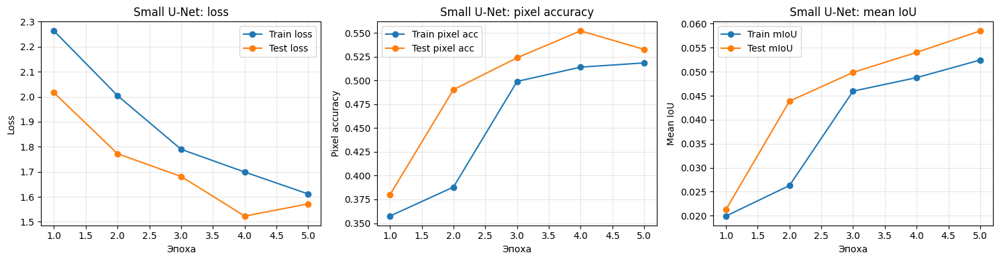

In [103]:
plot_segmentation_history(history_unet, "Small U-Net")

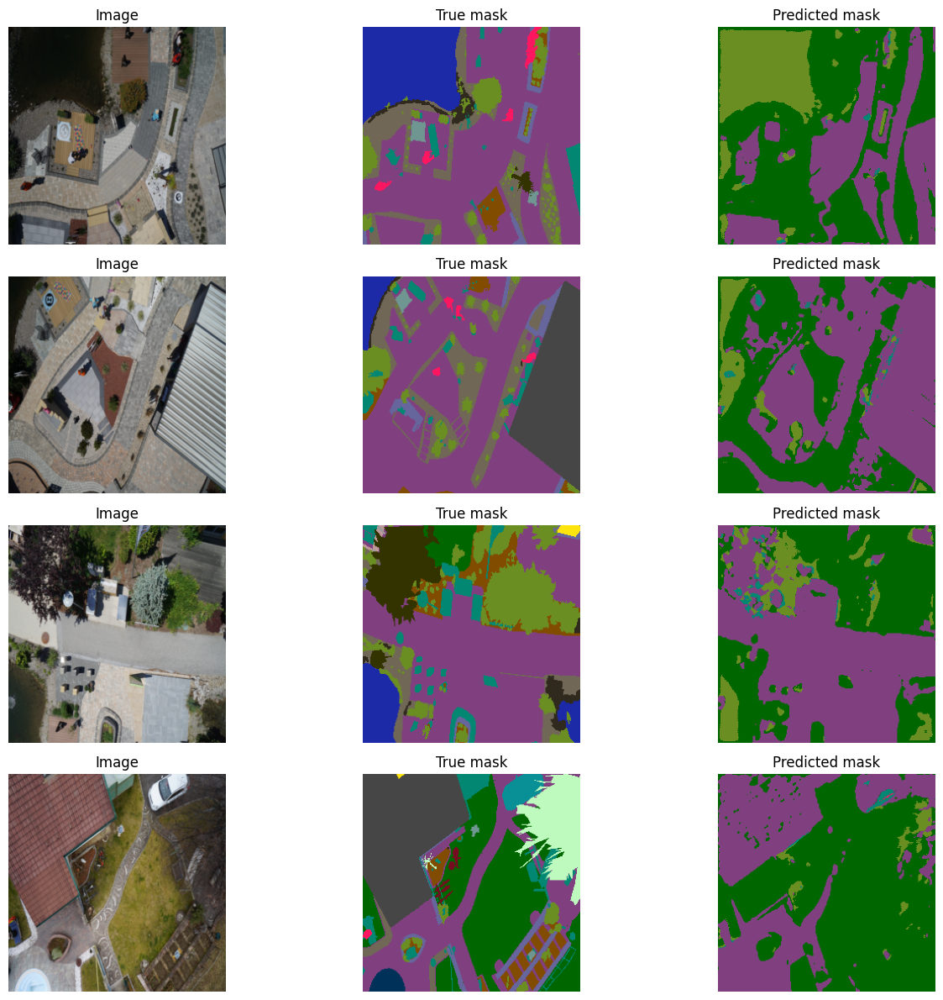

In [104]:
unet_model.eval()

images, masks = next(iter(seg_test_loader))

with torch.no_grad():
    outputs = unet_model(images.to(device))
    predictions = outputs.argmax(dim=1).cpu()

plt.figure(figsize=(14, 12))

for i in range(4):
    image = images[i].permute(1, 2, 0).numpy()
    true_mask_rgb = mask_to_rgb(masks[i].numpy())
    pred_mask_rgb = mask_to_rgb(predictions[i].numpy())

    plt.subplot(4, 3, i * 3 + 1)
    plt.imshow(image)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(4, 3, i * 3 + 2)
    plt.imshow(true_mask_rgb)
    plt.title("True mask")
    plt.axis("off")

    plt.subplot(4, 3, i * 3 + 3)
    plt.imshow(pred_mask_rgb)
    plt.title("Predicted mask")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [105]:
segmentation_results.append({
    "Модель": "Small U-Net",
    "Train pixel accuracy": history_unet["train_pixel_accuracy"][-1],
    "Test pixel accuracy": history_unet["test_pixel_accuracy"][-1],
    "Train mean IoU": history_unet["train_mean_iou"][-1],
    "Test mean IoU": history_unet["test_mean_iou"][-1],
    "Train loss": history_unet["train_loss"][-1],
    "Test loss": history_unet["test_loss"][-1]
})

segmentation_results_df = pd.DataFrame(segmentation_results)

segmentation_results_df_rounded = segmentation_results_df.copy()

for column in [
    "Train pixel accuracy",
    "Test pixel accuracy",
    "Train mean IoU",
    "Test mean IoU",
    "Train loss",
    "Test loss"
]:
    segmentation_results_df_rounded[column] = segmentation_results_df_rounded[column].round(4)

segmentation_results_df_rounded

,Модель,Train pixel accuracy,Test pixel accuracy,Train mean IoU,Test mean IoU,Train loss,Test loss
0,SimpleSegNet,0.3772,0.3798,0.0203,0.0211,2.0473,1.9380
1,Small U-Net,0.5184,0.5326,0.0524,0.0585,1.6111,1.5715


In [107]:
history_unet_more = run_segmentation_experiment(
    model=unet_model,
    train_loader=seg_train_loader,
    test_loader=seg_test_loader,
    criterion=seg_criterion,
    optimizer=unet_optimizer,
    epochs=5
)

Epoch 1/5


100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


train_loss: 1.4327, train_pix_acc: 0.5597, train_mIoU: 0.0757, test_loss: 1.3426, test_pix_acc: 0.5840, test_mIoU: 0.0752

Epoch 2/5


100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


train_loss: 1.3977, train_pix_acc: 0.5595, train_mIoU: 0.0763, test_loss: 1.4598, test_pix_acc: 0.5370, test_mIoU: 0.0706

Epoch 3/5


100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


train_loss: 1.3661, train_pix_acc: 0.5628, train_mIoU: 0.0787, test_loss: 1.3038, test_pix_acc: 0.5914, test_mIoU: 0.0795

Epoch 4/5


100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


train_loss: 1.4221, train_pix_acc: 0.5576, train_mIoU: 0.0845, test_loss: 1.2833, test_pix_acc: 0.5975, test_mIoU: 0.0918

Epoch 5/5


100%|██████████| 20/20 [00:17<00:00,  1.14it/s]

train_loss: 1.3449, train_pix_acc: 0.5744, train_mIoU: 0.0920, test_loss: 1.2697, test_pix_acc: 0.6135, test_mIoU: 0.1085



In [108]:
for key in history_unet:
    history_unet[key].extend(history_unet_more[key])

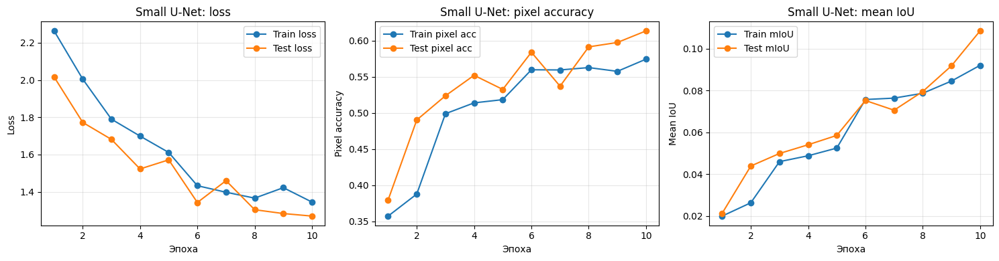

In [109]:
plot_segmentation_history(history_unet, "Small U-Net")

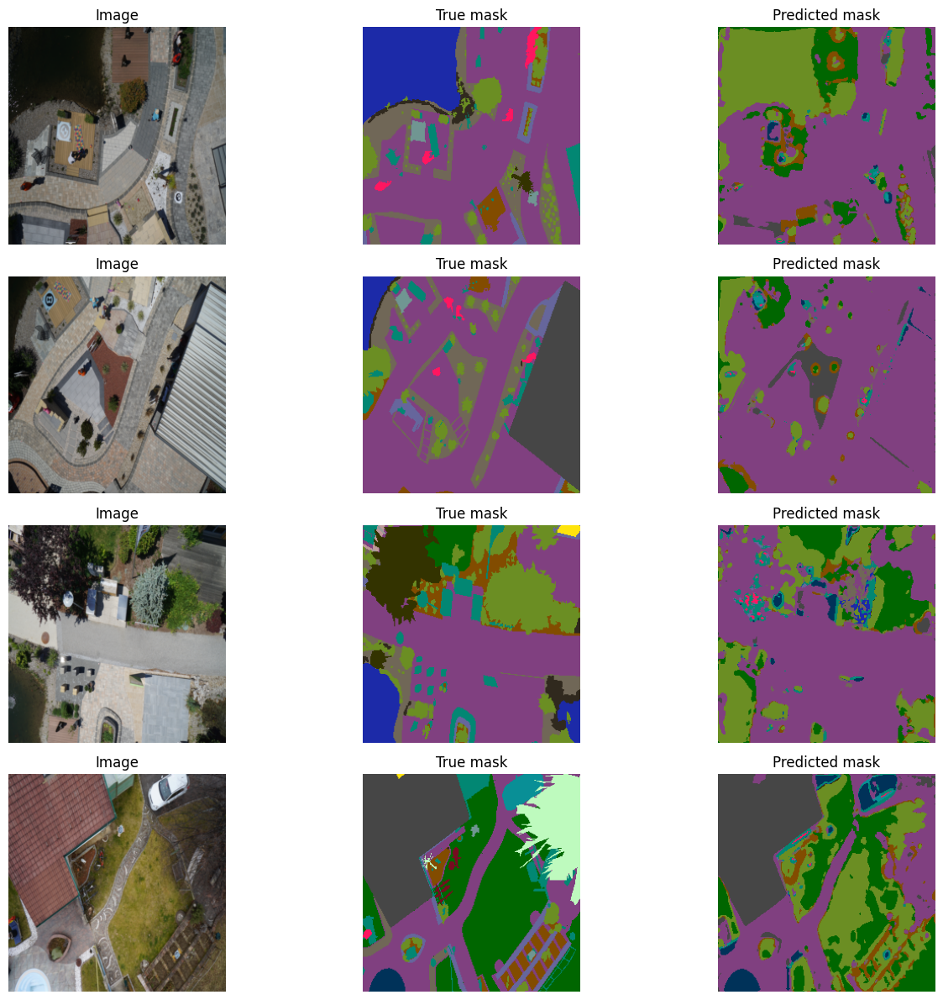

In [111]:
unet_model.eval()

images, masks = next(iter(seg_test_loader))

with torch.no_grad():
    outputs = unet_model(images.to(device))
    predictions = outputs.argmax(dim=1).cpu()

plt.figure(figsize=(14, 12))

for i in range(4):
    image = images[i].permute(1, 2, 0).numpy()
    true_mask_rgb = mask_to_rgb(masks[i].numpy())
    pred_mask_rgb = mask_to_rgb(predictions[i].numpy())

    plt.subplot(4, 3, i * 3 + 1)
    plt.imshow(image)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(4, 3, i * 3 + 2)
    plt.imshow(true_mask_rgb)
    plt.title("True mask")
    plt.axis("off")

    plt.subplot(4, 3, i * 3 + 3)
    plt.imshow(pred_mask_rgb)
    plt.title("Predicted mask")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [112]:
segmentation_results = [
    result for result in segmentation_results
    if result["Модель"] != "Small U-Net"
]

segmentation_results.append({
    "Модель": "Small U-Net",
    "Train pixel accuracy": history_unet["train_pixel_accuracy"][-1],
    "Test pixel accuracy": history_unet["test_pixel_accuracy"][-1],
    "Train mean IoU": history_unet["train_mean_iou"][-1],
    "Test mean IoU": history_unet["test_mean_iou"][-1],
    "Train loss": history_unet["train_loss"][-1],
    "Test loss": history_unet["test_loss"][-1]
})

segmentation_results_df = pd.DataFrame(segmentation_results)

segmentation_results_df_rounded = segmentation_results_df.copy()

for column in [
    "Train pixel accuracy",
    "Test pixel accuracy",
    "Train mean IoU",
    "Test mean IoU",
    "Train loss",
    "Test loss"
]:
    segmentation_results_df_rounded[column] = segmentation_results_df_rounded[column].round(4)

segmentation_results_df_rounded = segmentation_results_df_rounded.sort_values(
    by="Test mean IoU",
    ascending=False
).reset_index(drop=True)

display(segmentation_results_df_rounded)

,Модель,Train pixel accuracy,Test pixel accuracy,Train mean IoU,Test mean IoU,Train loss,Test loss
0,Small U-Net,0.5744,0.6135,0.0920,0.1085,1.3449,1.2697
1,SimpleSegNet,0.3772,0.3798,0.0203,0.0211,2.0473,1.9380


### Анализ результатов U-Net

После увеличения количества эпох U-Net стала заметно лучше выделять крупные области изображения: дороги, тротуары, растительность и здания.

По сравнению с SimpleSegNet предсказанные маски стали более разнообразными и ближе к истинным маскам.  
Это связано с использованием skip connections, которые помогают decoder восстанавливать пространственные детали.

При этом мелкие объекты и границы классов остаются сложными для модели. Причины:

- небольшое количество обучающих изображений;
- сильный дисбаланс классов по пикселям;
- уменьшение исходных изображений до `256x256`;
- большое количество классов сегментации.

## Модель 3: U-Net с весами классов

В третьем эксперименте используется та же архитектура U-Net, но меняется функция потерь.

Так как классы в задаче сегментации несбалансированы по количеству пикселей, обычная `CrossEntropyLoss` может приводить к тому, что модель предпочитает часто встречающиеся классы.

Для учета дисбаланса используются веса классов: редкие классы получают больший вес в функции потерь.

In [115]:
def compute_class_weights_sqrt(dataset, num_classes, max_weight=5.0):
    class_counts = torch.zeros(num_classes, dtype=torch.float64)

    for _, mask in tqdm(dataset):
        values, counts = torch.unique(mask, return_counts=True)
        class_counts[values] += counts.double()

    class_counts = class_counts + 1.0

    class_weights = 1.0 / torch.sqrt(class_counts)
    class_weights = class_weights / class_weights.mean()
    class_weights = torch.clamp(class_weights, max=max_weight)

    return class_weights.float()


class_weights = compute_class_weights_sqrt(
    seg_train_dataset,
    num_seg_classes,
    max_weight=5.0
).to(device)

print(class_weights)
print("min:", class_weights.min().item())
print("max:", class_weights.max().item())

100%|██████████| 320/320 [01:24<00:00,  3.79it/s]

tensor([0.1641, 0.0079, 0.0272, 0.0110, 0.0179, 0.0317, 0.0553, 0.0580, 0.0181,
        0.0174, 0.0296, 0.0636, 0.2803, 0.0484, 0.2123, 0.0468, 0.4083, 0.0532,
        0.1086, 0.0332, 0.0424, 0.0979, 0.0256, 5.0000], device='cuda:0')
min: 0.00787194725126028
max: 5.0


In [116]:
weighted_unet_model = SmallUNet(num_seg_classes).to(device)

weighted_seg_criterion = nn.CrossEntropyLoss(weight=class_weights)

weighted_unet_optimizer = optim.Adam(
    weighted_unet_model.parameters(),
    lr=0.001
)

history_weighted_unet = run_segmentation_experiment(
    model=weighted_unet_model,
    train_loader=seg_train_loader,
    test_loader=seg_test_loader,
    criterion=weighted_seg_criterion,
    optimizer=weighted_unet_optimizer,
    epochs=10
)

Epoch 1/10


100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


train_loss: 2.8919, train_pix_acc: 0.3341, train_mIoU: 0.0184, test_loss: 2.6794, test_pix_acc: 0.4069, test_mIoU: 0.0288

Epoch 2/10


100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


train_loss: 2.5612, train_pix_acc: 0.4617, train_mIoU: 0.0421, test_loss: 2.3604, test_pix_acc: 0.5201, test_mIoU: 0.0502

Epoch 3/10


100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


train_loss: 2.4235, train_pix_acc: 0.4907, train_mIoU: 0.0479, test_loss: 2.3047, test_pix_acc: 0.5396, test_mIoU: 0.0515

Epoch 4/10


100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


train_loss: 2.2923, train_pix_acc: 0.5208, train_mIoU: 0.0576, test_loss: 2.2134, test_pix_acc: 0.5443, test_mIoU: 0.0633

Epoch 5/10


100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


train_loss: 2.2341, train_pix_acc: 0.5060, train_mIoU: 0.0598, test_loss: 2.1464, test_pix_acc: 0.5326, test_mIoU: 0.0688

Epoch 6/10


100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


train_loss: 2.1576, train_pix_acc: 0.5003, train_mIoU: 0.0653, test_loss: 2.0862, test_pix_acc: 0.5492, test_mIoU: 0.0746

Epoch 7/10


100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


train_loss: 2.1230, train_pix_acc: 0.5041, train_mIoU: 0.0736, test_loss: 2.0395, test_pix_acc: 0.5326, test_mIoU: 0.0792

Epoch 8/10


100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


train_loss: 2.0923, train_pix_acc: 0.4957, train_mIoU: 0.0783, test_loss: 2.0745, test_pix_acc: 0.5292, test_mIoU: 0.0763

Epoch 9/10


100%|██████████| 20/20 [00:19<00:00,  1.00it/s]


train_loss: 2.0990, train_pix_acc: 0.4770, train_mIoU: 0.0757, test_loss: 2.0367, test_pix_acc: 0.5280, test_mIoU: 0.0923

Epoch 10/10


100%|██████████| 20/20 [00:20<00:00,  1.04s/it]

train_loss: 2.0409, train_pix_acc: 0.5020, train_mIoU: 0.0841, test_loss: 2.0790, test_pix_acc: 0.4529, test_mIoU: 0.0797



In [117]:
best_weighted_epoch = int(np.argmax(history_weighted_unet["test_mean_iou"]))

best_weighted_result = {
    "Модель": "Small U-Net + class weights",
    "Train pixel accuracy": history_weighted_unet["train_pixel_accuracy"][best_weighted_epoch],
    "Test pixel accuracy": history_weighted_unet["test_pixel_accuracy"][best_weighted_epoch],
    "Train mean IoU": history_weighted_unet["train_mean_iou"][best_weighted_epoch],
    "Test mean IoU": history_weighted_unet["test_mean_iou"][best_weighted_epoch],
    "Train loss": history_weighted_unet["train_loss"][best_weighted_epoch],
    "Test loss": history_weighted_unet["test_loss"][best_weighted_epoch]
}

print("Лучшая эпоха:", best_weighted_epoch + 1)
print("Best test mIoU:", best_weighted_result["Test mean IoU"])
print("Best test pixel accuracy:", best_weighted_result["Test pixel accuracy"])

Лучшая эпоха: 9
Best test mIoU: 0.09234834878875028
Best test pixel accuracy: 0.5280246734619141


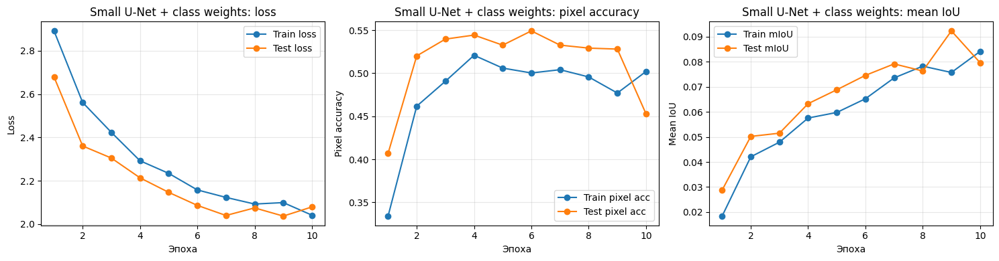

In [118]:
plot_segmentation_history(history_weighted_unet, "Small U-Net + class weights")

In [119]:
segmentation_results = [
    result for result in segmentation_results
    if result["Модель"] != "Small U-Net + class weights"
]

segmentation_results.append(best_weighted_result)

segmentation_results_df = pd.DataFrame(segmentation_results)

segmentation_results_df_rounded = segmentation_results_df.copy()

for column in [
    "Train pixel accuracy",
    "Test pixel accuracy",
    "Train mean IoU",
    "Test mean IoU",
    "Train loss",
    "Test loss"
]:
    segmentation_results_df_rounded[column] = segmentation_results_df_rounded[column].round(4)

segmentation_results_df_rounded = segmentation_results_df_rounded.sort_values(
    by="Test mean IoU",
    ascending=False
).reset_index(drop=True)

display(segmentation_results_df_rounded)

,Модель,Train pixel accuracy,Test pixel accuracy,Train mean IoU,Test mean IoU,Train loss,Test loss
0,Small U-Net,0.5744,0.6135,0.0920,0.1085,1.3449,1.2697
1,Small U-Net + class weights,0.4770,0.5280,0.0757,0.0923,2.0990,2.0367
2,SimpleSegNet,0.3772,0.3798,0.0203,0.0211,2.0473,1.9380


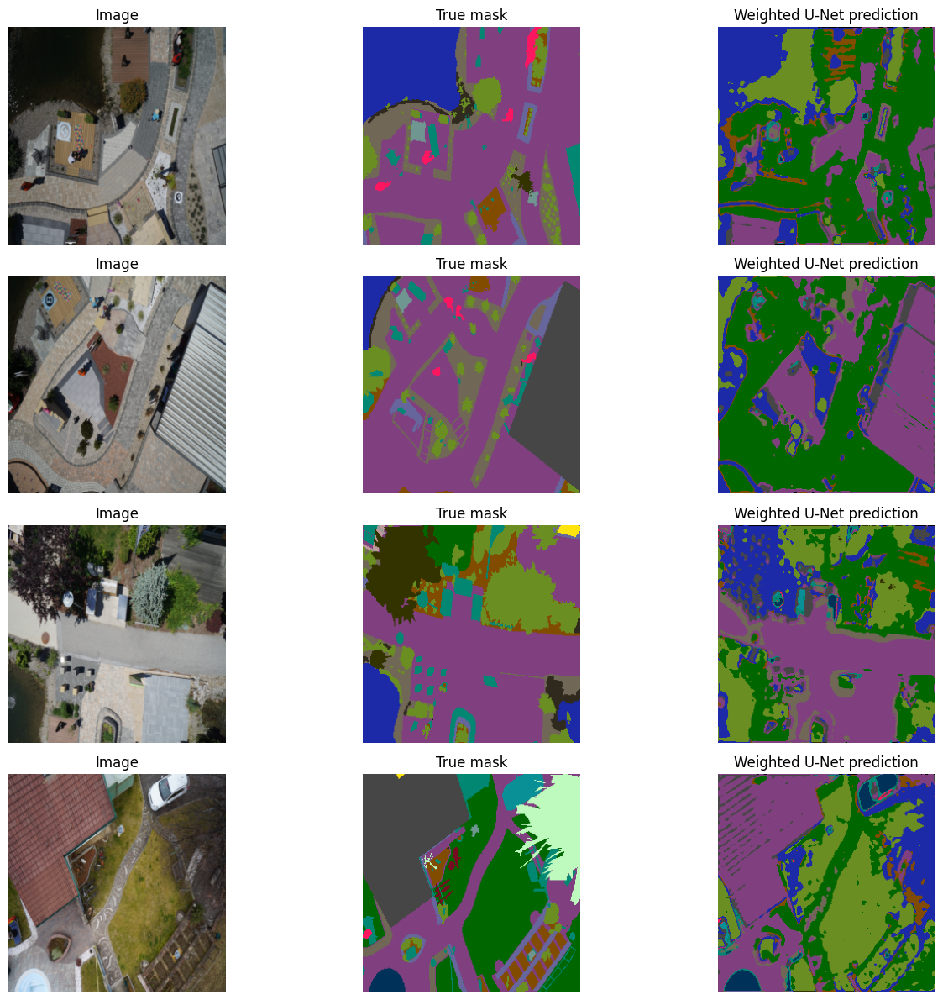

In [120]:
weighted_unet_model.eval()

images, masks = next(iter(seg_test_loader))

with torch.no_grad():
    outputs = weighted_unet_model(images.to(device))
    predictions = outputs.argmax(dim=1).cpu()

plt.figure(figsize=(14, 12))

for i in range(4):
    image = images[i].permute(1, 2, 0).numpy()
    true_mask_rgb = mask_to_rgb(masks[i].numpy())
    pred_mask_rgb = mask_to_rgb(predictions[i].numpy())

    plt.subplot(4, 3, i * 3 + 1)
    plt.imshow(image)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(4, 3, i * 3 + 2)
    plt.imshow(true_mask_rgb)
    plt.title("True mask")
    plt.axis("off")

    plt.subplot(4, 3, i * 3 + 3)
    plt.imshow(pred_mask_rgb)
    plt.title("Weighted U-Net prediction")
    plt.axis("off")

plt.tight_layout()
plt.show()

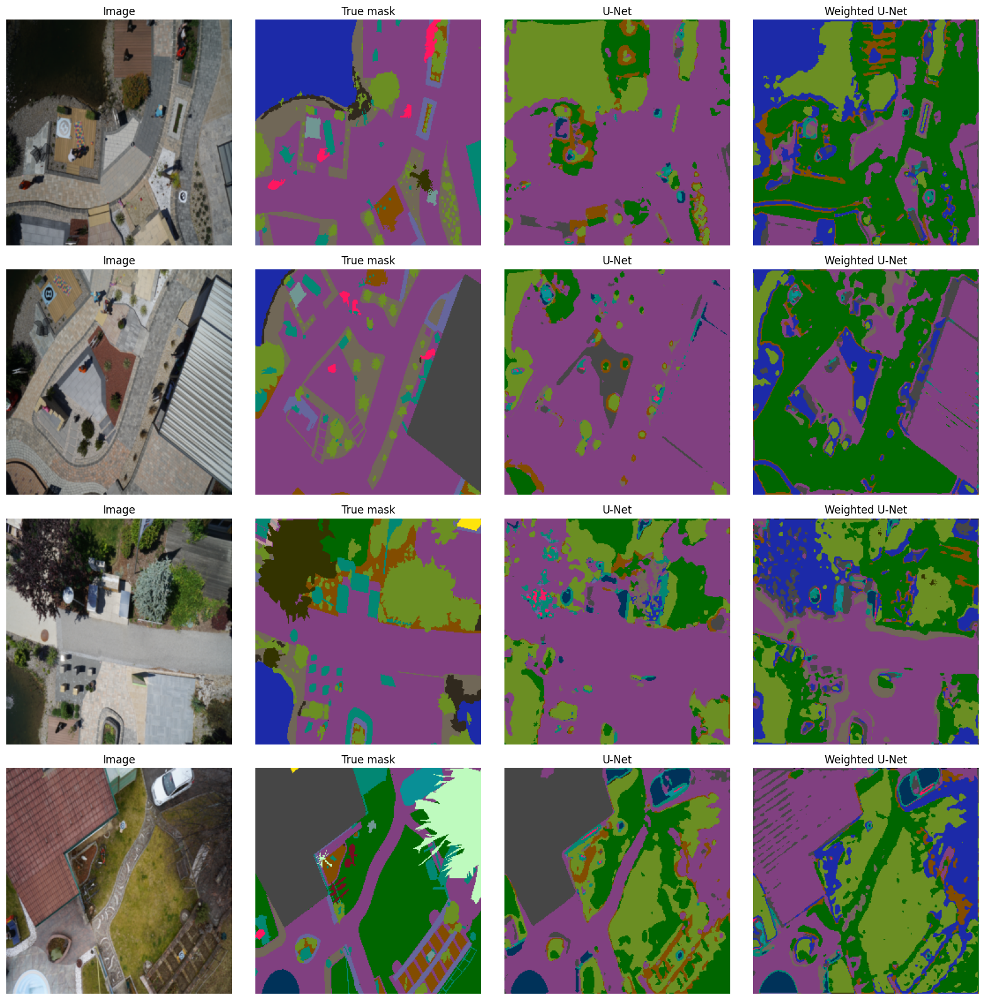

In [121]:
unet_model.eval()
weighted_unet_model.eval()

images, masks = next(iter(seg_test_loader))

with torch.no_grad():
    outputs_unet = unet_model(images.to(device))
    preds_unet = outputs_unet.argmax(dim=1).cpu()

    outputs_weighted = weighted_unet_model(images.to(device))
    preds_weighted = outputs_weighted.argmax(dim=1).cpu()

plt.figure(figsize=(16, 16))

for i in range(4):
    image = images[i].permute(1, 2, 0).numpy()
    true_mask_rgb = mask_to_rgb(masks[i].numpy())
    pred_unet_rgb = mask_to_rgb(preds_unet[i].numpy())
    pred_weighted_rgb = mask_to_rgb(preds_weighted[i].numpy())

    plt.subplot(4, 4, i * 4 + 1)
    plt.imshow(image)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(4, 4, i * 4 + 2)
    plt.imshow(true_mask_rgb)
    plt.title("True mask")
    plt.axis("off")

    plt.subplot(4, 4, i * 4 + 3)
    plt.imshow(pred_unet_rgb)
    plt.title("U-Net")
    plt.axis("off")

    plt.subplot(4, 4, i * 4 + 4)
    plt.imshow(pred_weighted_rgb)
    plt.title("Weighted U-Net")
    plt.axis("off")

plt.tight_layout()
plt.show()

### Анализ модели с весами классов

Взвешенная функция потерь была добавлена для учета дисбаланса классов по пикселям.

По результатам эксперимента модель `Small U-Net + class weights` стала активнее выделять разные классы, однако обучение оказалось менее стабильным.  
`Pixel accuracy` снизилась, так как модель перестала ориентироваться только на самые частые классы.

При этом `mean IoU` показывает, что модель начала лучше учитывать менее представленные классы.  
В данном эксперименте лучший итоговый результат все равно показала обычная `Small U-Net`, но эксперимент с весами классов полезен для анализа влияния дисбаланса данных на качество сегментации.

In [122]:
segmentation_results_df_rounded = segmentation_results_df_rounded.sort_values(
    by="Test mean IoU",
    ascending=False
).reset_index(drop=True)

display(segmentation_results_df_rounded)

,Модель,Train pixel accuracy,Test pixel accuracy,Train mean IoU,Test mean IoU,Train loss,Test loss
0,Small U-Net,0.5744,0.6135,0.0920,0.1085,1.3449,1.2697
1,Small U-Net + class weights,0.4770,0.5280,0.0757,0.0923,2.0990,2.0367
2,SimpleSegNet,0.3772,0.3798,0.0203,0.0211,2.0473,1.9380


### Сравнение моделей сегментации

В рамках задания были обучены три модели сегментации:

- `SimpleSegNet`;
- `Small U-Net`;
- `Small U-Net + class weights`.

`SimpleSegNet` показала самый слабый результат. Модель фактически предсказывала преимущественно один самый частый класс, поэтому `mean IoU` оказался очень низким.

`Small U-Net` показала лучший результат среди всех моделей. Skip connections помогли decoder восстанавливать пространственные детали и выделять крупные области изображения.

`Small U-Net + class weights` была обучена с учетом дисбаланса классов. Такая модель стала активнее выделять разные классы, но обучение оказалось менее стабильным. В данном эксперименте взвешенная функция потерь не смогла превзойти обычную U-Net по итоговому `mean IoU`.

## Вывод по заданию 2

В задании 2 была решена задача семантической сегментации аэроснимков на датасете Semantic Drone Dataset.

Исходные изображения не использовались в полном разрешении: перед обучением они уменьшались до `256x256`, что соответствует требованию задания.

Были обучены три модели:

- простая encoder-decoder CNN `SimpleSegNet`;
- модель `Small U-Net`;
- модель `Small U-Net + class weights`.

Лучший результат показала модель `Small U-Net`. Она получила наилучшее значение `Test mean IoU` и визуально лучше выделяла крупные области сцены.

Эксперимент с весами классов показал влияние дисбаланса данных: модель стала предсказывать больше разных классов, но качество стало менее стабильным.  
Для дальнейшего улучшения качества можно увеличить размер входных изображений, обучать модель больше эпох, использовать аугментации и более сильные архитектуры сегментации.